In [ ]:

from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import os
import json
import csv


json_folder = '/content/drive/MyDrive/smai/annotation/annotation'

if not os.path.exists(json_folder):
    print(f"Folder '{json_folder}' not found.")
    exit()


for filename in os.listdir(json_folder):
    if filename.endswith('.json'):
        json_path = os.path.join(json_folder, filename)


        with open(json_path, 'r', encoding='utf-8') as f:
            data = json.load(f)


        factor = data.get('factor', '')
        deductions = data.get('deductions', '')

        pc = data.get('program_component', {})
        skating_skills_score = pc.get('skating_skills', {}).get('score_of_pannel', '')
        transitions_score = pc.get('transitions', {}).get('score_of_pannel', '')
        performance_score = pc.get('performance', {}).get('score_of_pannel', '')
        composition_score = pc.get('composition', {}).get('score_of_pannel', '')
        interpretation_score = pc.get('interpretation', {}).get('score_of_pannel', '')


        rows = []
        elements = data.get('executed_element', {})
        for _, elem in elements.items():
            row = {
                'factor': factor,
                'deductions': deductions,
                'element': elem.get('element', ''),
                'jump_comb': elem.get('jump_comb', ''),
                'bv': elem.get('bv', ''),
                'goe': elem.get('goe', ''),
                'info': elem.get('info', ''),
                'time': elem.get('time', ''),
                'coarse_class': elem.get('coarse_class', ''),
                'score_of_panel': elem.get('score_of_pannel', ''),
                'skating_skills_score': skating_skills_score,
                'transitions_score': transitions_score,
                'performance_score': performance_score,
                'composition_score': composition_score,
                'interpretation_score': interpretation_score,
            }
            rows.append(row)


        csv_filename = filename.replace('.json', '.csv')
        csv_path = os.path.join(json_folder, csv_filename)


        fieldnames = list(rows[0].keys())
        with open(csv_path, 'w', newline='', encoding='utf-8') as csvfile:
            writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
            writer.writeheader()
            writer.writerows(rows)

        print(f"Converted: {filename} → {csv_filename}")


Converted: 0.json → 0.csv
Converted: 1.json → 1.csv
Converted: 10.json → 10.csv
Converted: 100.json → 100.csv
Converted: 1000.json → 1000.csv
Converted: 1001.json → 1001.csv
Converted: 1002.json → 1002.csv
Converted: 1003.json → 1003.csv
Converted: 1004.json → 1004.csv
Converted: 1005.json → 1005.csv
Converted: 1006.json → 1006.csv
Converted: 1007.json → 1007.csv
Converted: 1008.json → 1008.csv
Converted: 1009.json → 1009.csv
Converted: 101.json → 101.csv
Converted: 1010.json → 1010.csv
Converted: 1011.json → 1011.csv
Converted: 1012.json → 1012.csv
Converted: 1013.json → 1013.csv
Converted: 1014.json → 1014.csv
Converted: 1015.json → 1015.csv
Converted: 1016.json → 1016.csv
Converted: 1017.json → 1017.csv
Converted: 1018.json → 1018.csv
Converted: 1019.json → 1019.csv
Converted: 102.json → 102.csv
Converted: 1020.json → 1020.csv
Converted: 1021.json → 1021.csv
Converted: 1022.json → 1022.csv
Converted: 1023.json → 1023.csv
Converted: 1024.json → 1024.csv
Converted: 1025.json → 1025.cs

In [ ]:

import pandas as pd
import glob
import os


folder_path = '/content/drive/MyDrive/smai/annotation/annotation'


all_files = glob.glob(os.path.join(folder_path, "*.csv"))


df_list = []


for filename in all_files:
    try:

        df = pd.read_csv(filename, index_col=None, header=0)
        df_list.append(df)
    except pd.errors.EmptyDataError:
        print(f"Warning: Skipping empty file {filename}")
    except pd.errors.ParserError:
        print(f"Warning: Skipping file with parsing error {filename}")



merged_df = pd.concat(df_list, axis=0, ignore_index=True)


merged_df.to_csv('/content/drive/MyDrive/smai/merged_annotation.csv', index=False)  # Replace with your desired output path
print("Merged CSV file created successfully!")


Merged CSV file created successfully!


In [ ]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10359 entries, 0 to 10358
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   factor                10359 non-null  float64
 1   deductions            10359 non-null  float64
 2   element               10359 non-null  object 
 3   jump_comb             10359 non-null  int64  
 4   bv                    10359 non-null  float64
 5   goe                   10359 non-null  float64
 6   info                  8441 non-null   object 
 7   time                  10359 non-null  object 
 8   coarse_class          9701 non-null   object 
 9   score_of_panel        10359 non-null  float64
 10  skating_skills_score  10359 non-null  float64
 11  transitions_score     10359 non-null  float64
 12  performance_score     10359 non-null  float64
 13  composition_score     10359 non-null  float64
 14  interpretation_score  10359 non-null  float64
dtypes: float64(10), int

In [ ]:

for col in merged_df.columns:
    if merged_df[col].dtype == 'object':
        print(f"Unique values in column '{col}':")
        print(f"Length : {len(merged_df[col].unique())}")
        print(merged_df[col].unique())
        print()


Unique values in column 'element':
Length : 243
['3A' '4T' 'FCSp3' 'CSSp4' '3Lz+3T' 'StSq2' 'CCoSp3' '3F+3T' 'FCSp4' '1Lz'
 'StSq3' 'CCoSp4' '3F' 'FCSp2' 'FSSp4' '3Lz' 'CCSp3' 'StSq4' '2A+2T'
 '3Lz+2T' '3S+1Eu+2F' 'ChSq1' '2A' 'LSp3' '3S' '2Lo' '3F+1Eu+2F' '3Lo+2T'
 '2S' '3Lo' '3S+2T' '1A' 'FCCoSp4' '2A+1Eu+3S' 'FSSp3' 'LSp4' '2A+3T' '3T'
 '2A+2T+2Lo' '2Lz' '3Lz+1Eu+3S' '3F+2T' '3S+2T+2Lo' 'SSp4' '1A+1Eu+3S'
 '3F+2T+2Lo' 'CCSp4' '3S+3T' '2A+1T+2T' '3A+2T' '3F+3T+2T' '2F' '4T+2T'
 '3A+1Eu+2S' '2Lz+2T' 'FCCoSp3' '3A+REP' 'FSSp2' '3F+1Eu+3S' '4S'
 '1A+1Eu+2S' '3F+2Lo' '4T+3T' 'CSSp2' '3F+SEQ+2S' '4Lo' '3F+3Lo'
 '2Lz+2T+2Lo' 'CCoSp' '2T' '3Lz+1Eu+3F' '3A+1Eu+3S' '4Lz' '4Lz+3T' 'CSSp3'
 '4F+3T' '4T+1Eu+3F' '1F' 'StSq1' 'LSp1' '3Lz+SEQ+2S' '3T+3T' '3Lo+2T+2Lo'
 '3Lz+1Eu+2F' '1Lo' '3T+2T+2Lo' '3F+1Eu+2S' '3Lz+2T+2Lo' '3Fq+2T+2Lo'
 '3A+3T' '4S+3T' '3Lo+2A+SEQ' 'CCoSp2' '3Lz+1Eu+2S' '4S+2T+2Lo' '3Lz+3Lo'
 '3Lz+2T+2T' '3Lo+1Eu+3S' '4T+1Eu+3S' '2A+3T+2T' '3Lz+2A+SEQ' 'FCCoSp2'
 '3S+SEQ+2S' 'FCSSp

In [ ]:
import pandas as pd


def time_diff(time_str):
    try:
        start_time, end_time = time_str.split(',')
        start_min, start_sec = map(int, start_time.split('-'))
        end_min, end_sec = map(int, end_time.split('-'))
        start_total_seconds = start_min * 60 + start_sec
        end_total_seconds = end_min * 60 + end_sec
        return end_total_seconds - start_total_seconds
    except (ValueError, AttributeError):
        return None

merged_df['time_diff'] = merged_df['time'].apply(time_diff)

In [ ]:
merged_df['time_diff']

,time_diff
0,3
1,4
2,15
3,14
4,5
...,...
10354,4
10355,2
10356,12
10357,57


In [ ]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10359 entries, 0 to 10358
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   factor                10359 non-null  float64
 1   deductions            10359 non-null  float64
 2   element               10359 non-null  object 
 3   jump_comb             10359 non-null  int64  
 4   bv                    10359 non-null  float64
 5   goe                   10359 non-null  float64
 6   info                  8441 non-null   object 
 7   time                  10359 non-null  object 
 8   coarse_class          9701 non-null   object 
 9   score_of_panel        10359 non-null  float64
 10  skating_skills_score  10359 non-null  float64
 11  transitions_score     10359 non-null  float64
 12  performance_score     10359 non-null  float64
 13  composition_score     10359 non-null  float64
 14  interpretation_score  10359 non-null  float64
 15  time_diff          

In [ ]:
merged_df.columns

Index(['factor', 'deductions', 'element', 'jump_comb', 'bv', 'goe', 'info',
       'time', 'coarse_class', 'score_of_panel', 'skating_skills_score',
       'transitions_score', 'performance_score', 'composition_score',
       'interpretation_score', 'time_diff'],
      dtype='object')

# Data Visulization

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#new
import os
import json
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.gridspec import GridSpec
from scipy import stats


sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (16, 12)
plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['font.size'] = 14
plt.rcParams['axes.labelsize'] = 16
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['xtick.labelsize'] = 14
plt.rcParams['ytick.labelsize'] = 14
plt.rcParams['legend.fontsize'] = 14
plt.rcParams['legend.title_fontsize'] = 16
colors = sns.color_palette("viridis", 5)


annotation_folder = "/content/drive/MyDrive/smai/annotation/annotation"


def read_all_json_files(folder_path):
    data_list = []

    if not os.path.exists(folder_path):
        raise FileNotFoundError(f"The folder {folder_path} does not exist.")

    for filename in os.listdir(folder_path):
        if filename.endswith('.json'):
            file_path = os.path.join(folder_path, filename)
            try:
                with open(file_path, 'r') as file:
                    data = json.load(file)
                    data_list.append(data)
            except Exception as e:
                print(f"Error reading {filename}: {e}")

    return data_list


def json_to_df(data_list):
    records = []

    for data in data_list:
        record = {
            'competition': data.get('competition', ''),
            'competition_index': data.get('competition_index', ''),
            'total_segment_score': data.get('total_segment_score', 0),
            'total_element_score': data.get('total_element_score', 0),
            'total_program_component_score': data.get('total_program_component_score(factored)', 0),
            'deductions': data.get('deductions', 0),
        }


        elements = data.get('executed_element', {})
        jump_count = 0
        spin_count = 0
        sequence_count = 0

        for elem_key, elem_data in elements.items():
            coarse_class = elem_data.get('coarse_class', '')
            if coarse_class == 'jump':
                jump_count += 1
            elif coarse_class == 'spin':
                spin_count += 1
            elif coarse_class == 'sequence':
                sequence_count += 1

        record['jump_count'] = jump_count
        record['spin_count'] = spin_count
        record['sequence_count'] = sequence_count


        jump_goe = []
        spin_goe = []
        sequence_goe = []

        for elem_key, elem_data in elements.items():
            coarse_class = elem_data.get('coarse_class', '')
            goe = elem_data.get('goe', 0)
            if coarse_class == 'jump':
                jump_goe.append(goe)
            elif coarse_class == 'spin':
                spin_goe.append(goe)
            elif coarse_class == 'sequence':
                sequence_goe.append(goe)

        record['avg_jump_goe'] = np.mean(jump_goe) if jump_goe else 0
        record['avg_spin_goe'] = np.mean(spin_goe) if spin_goe else 0
        record['avg_sequence_goe'] = np.mean(sequence_goe) if sequence_goe else 0


        if 'program_component' in data:
            components = data['program_component']
            for comp_name, comp_data in components.items():
                record[f'{comp_name}'] = comp_data.get('score_of_pannel', 0)

        records.append(record)

    return pd.DataFrame(records)


def remove_outliers(df, columns):
    df_cleaned = df.copy()

    for col in columns:
        Q1 = df_cleaned[col].quantile(0.25)
        Q3 = df_cleaned[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        df_cleaned = df_cleaned[(df_cleaned[col] >= lower_bound) & (df_cleaned[col] <= upper_bound)]

    print(f"Removed {len(df) - len(df_cleaned)} outliers. Remaining data: {len(df_cleaned)} rows.")
    return df_cleaned


print(f"Reading JSON files from {annotation_folder}...")
data_list = read_all_json_files(annotation_folder)
print(f"Found {len(data_list)} JSON files.")


df = json_to_df(data_list)
print(f"Created DataFrame with {len(df)} rows and {len(df.columns)} columns.")


numerical_cols = ['total_segment_score', 'total_element_score', 'total_program_component_score']
df_cleaned = remove_outliers(df, numerical_cols)


print("\nBasic Statistics:")
print(df_cleaned[['total_segment_score', 'total_element_score', 'total_program_component_score']].describe())


tes = df_cleaned['total_element_score']
bimodality_coefficient = stats.kurtosis(tes) / (stats.skew(tes)**2 + 1)
print(f"\nBimodality coefficient for TES: {bimodality_coefficient:.4f}")
print("A value > 0.555 suggests bimodality.")


corr = df_cleaned['total_element_score'].corr(df_cleaned['total_program_component_score'])
print(f"\nCorrelation between TES and PCS: {corr:.4f}")

Reading JSON files from /content/drive/MyDrive/smai/annotation/annotation...
Found 1167 JSON files.
Created DataFrame with 1167 rows and 17 columns.
Removed 9 outliers. Remaining data: 1158 rows.

Basic Statistics:
       total_segment_score  total_element_score  total_program_component_score
count          1158.000000          1158.000000                    1158.000000
mean             93.215570            47.390121                      46.246002
std              37.144186            18.830257                      19.089558
min              36.220000            16.680000                      18.740000
25%              63.097500            32.572500                      30.872500
50%              81.335000            42.505000                      39.230000
75%             121.562500            59.815000                      62.265000
max             194.000000           100.360000                      95.000000

Bimodality coefficient for TES: -0.1677
A value > 0.555 suggests bimodali

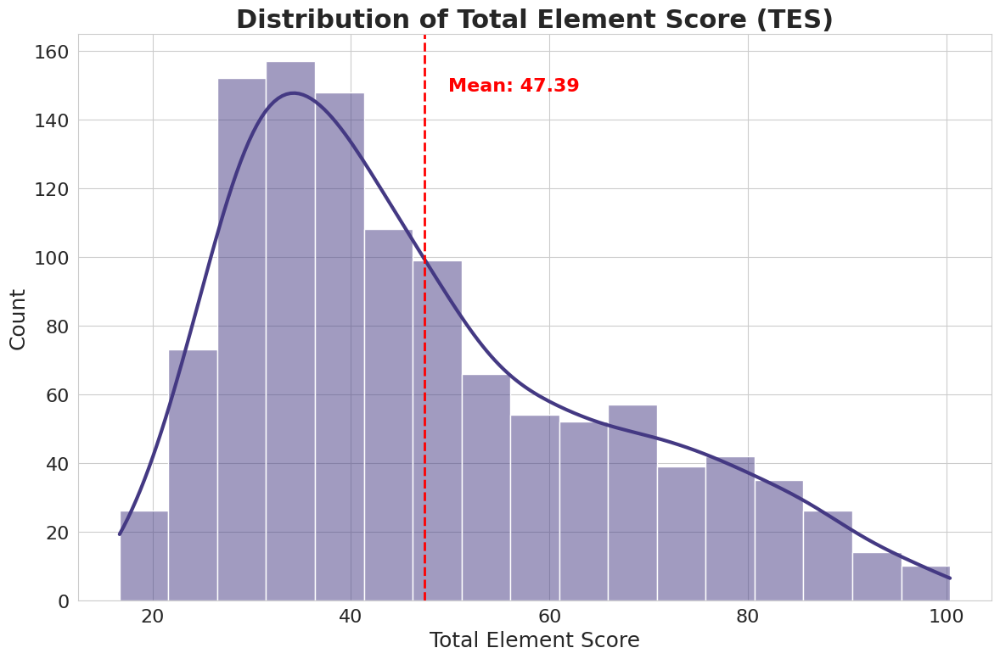

In [ ]:

plt.figure(figsize=(12, 8))

ax = sns.histplot(df_cleaned['total_element_score'], kde=True, color=colors[0], line_kws={'linewidth': 3})
plt.title('Distribution of Total Element Score (TES)', fontsize=22, fontweight='bold')
plt.xlabel('Total Element Score', fontsize=18)
plt.ylabel('Count', fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)


mean_tes = df_cleaned['total_element_score'].mean()
plt.axvline(mean_tes, color='red', linestyle='--', linewidth=2)
plt.text(mean_tes*1.05, ax.get_ylim()[1]*0.9, f'Mean: {mean_tes:.2f}',
         fontsize=16, color='red', fontweight='bold')

plt.tight_layout()
plt.show()

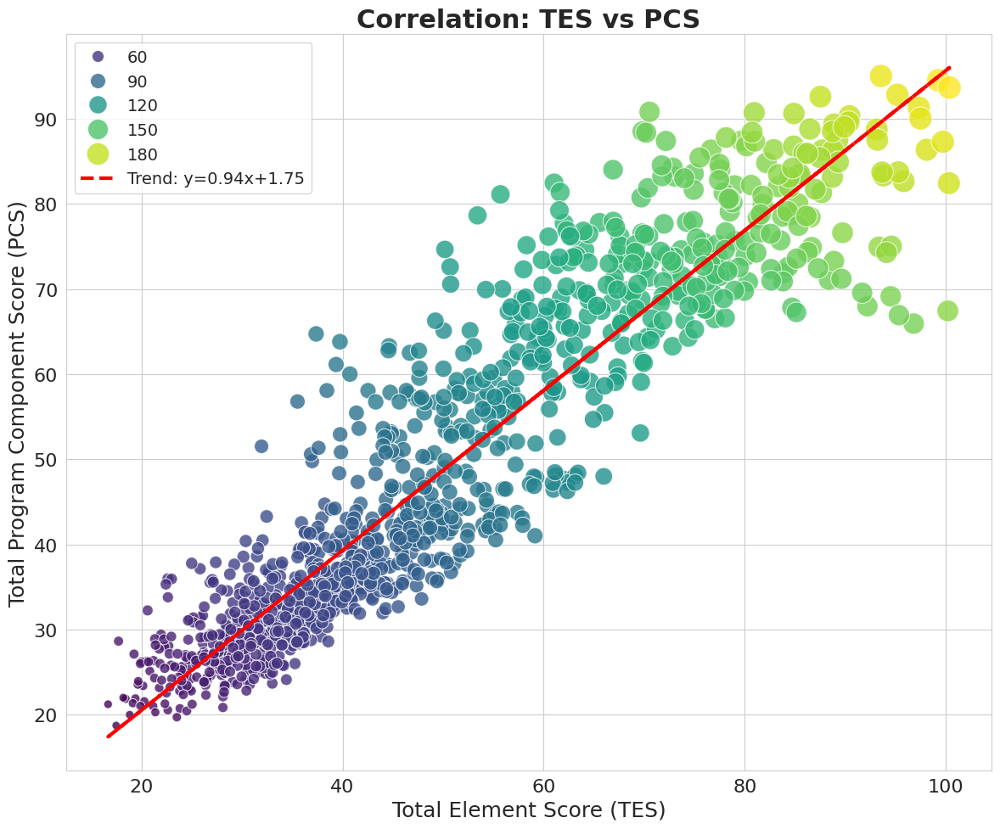

In [ ]:

plt.figure(figsize=(12, 10))

scatter = sns.scatterplot(
    x='total_element_score',
    y='total_program_component_score',
    data=df_cleaned,
    hue='total_segment_score',
    size='total_segment_score',
    sizes=(50, 400),
    palette='viridis',
    alpha=0.8
)
plt.title('Correlation: TES vs PCS', fontsize=22, fontweight='bold')
plt.xlabel('Total Element Score (TES)', fontsize=18)
plt.ylabel('Total Program Component Score (PCS)', fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)


z = np.polyfit(df_cleaned['total_element_score'], df_cleaned['total_program_component_score'], 1)
p = np.poly1d(z)
plt.plot(df_cleaned['total_element_score'], p(df_cleaned['total_element_score']),
         "r--", linewidth=3, label=f"Trend: y={z[0]:.2f}x+{z[1]:.2f}")
plt.legend(fontsize=14, title_fontsize=16)

plt.tight_layout()
plt.show()

<ipython-input-21-9f1e24d709f2>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


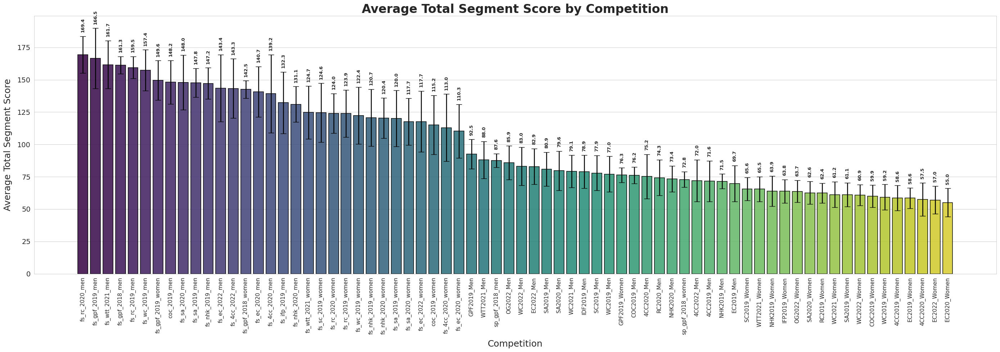

In [ ]:

plt.figure(figsize=(28, 10))

competition_avg = df_cleaned.groupby('competition')['total_segment_score'].mean().sort_values(ascending=False)
competition_std = df_cleaned.groupby('competition')['total_segment_score'].std()

ax = sns.barplot(
    x=competition_avg.index,
    y=competition_avg.values,
    palette='viridis',
    alpha=0.9,
    capsize=0.2,
    edgecolor='black',
    linewidth=1.2
)


for i, (avg, std) in enumerate(zip(competition_avg.values, competition_std.reindex(competition_avg.index).values)):
    plt.errorbar(i, avg, yerr=std, fmt='none', color='black', capsize=6, elinewidth=1.8)


    ax.text(i, avg + std + 3, f'{avg:.1f}', ha='center', va='bottom', fontsize=9, fontweight='bold', rotation=90)


plt.title('Average Total Segment Score by Competition', fontsize=24, fontweight='bold')
plt.xlabel('Competition', fontsize=18, labelpad=10)
plt.ylabel('Average Total Segment Score', fontsize=18, labelpad=10)
plt.xticks(rotation=90, ha='center', fontsize=11)
plt.yticks(fontsize=14)

plt.tight_layout()
plt.show()


<ipython-input-25-963457851467>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


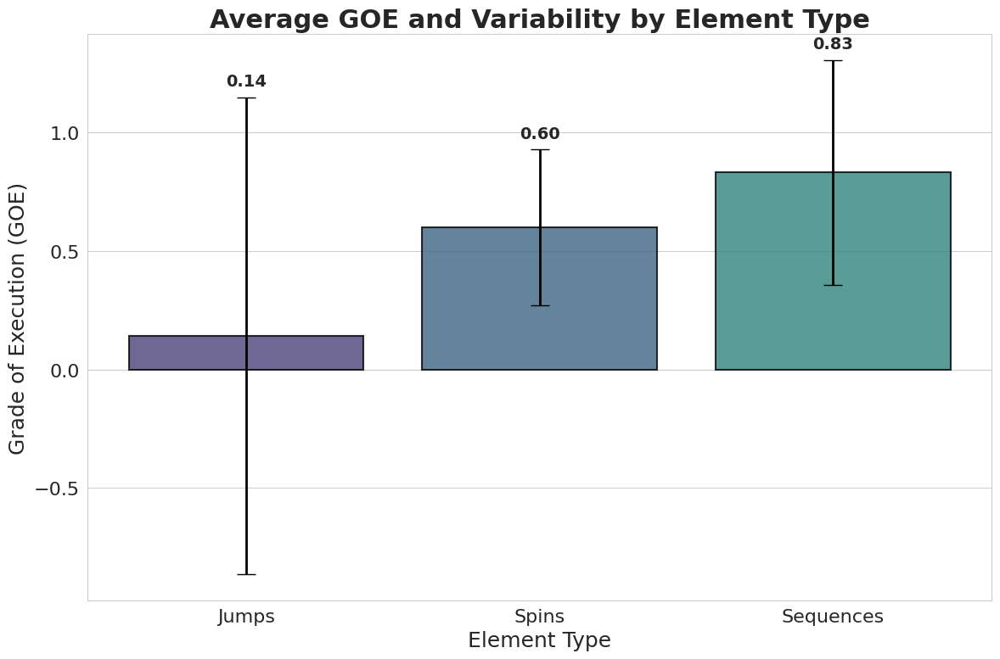

In [ ]:

plt.figure(figsize=(12, 8))

goe_data = pd.DataFrame({
    'Element Type': ['Jumps', 'Spins', 'Sequences'],
    'Average GOE': [
        df_cleaned['avg_jump_goe'].mean(),
        df_cleaned['avg_spin_goe'].mean(),
        df_cleaned['avg_sequence_goe'].mean()
    ],
    'GOE Std Dev': [
        df_cleaned['avg_jump_goe'].std(),
        df_cleaned['avg_spin_goe'].std(),
        df_cleaned['avg_sequence_goe'].std()
    ]
})

ax = sns.barplot(
    x='Element Type',
    y='Average GOE',
    data=goe_data,
    palette=colors[:3],
    alpha=0.8,
    edgecolor='black',
    linewidth=1.5
)


for i, (avg, std) in enumerate(zip(goe_data['Average GOE'], goe_data['GOE Std Dev'])):
    plt.errorbar(i, avg, yerr=std, fmt='none', color='black', capsize=8, elinewidth=2)
    ax.text(i, avg + std + 0.05, f'{avg:.2f}', ha='center', fontsize=14, fontweight='bold')

plt.title('Average GOE and Variability by Element Type', fontsize=22, fontweight='bold')
plt.xlabel('Element Type', fontsize=18)
plt.ylabel('Grade of Execution (GOE)', fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.tight_layout()
plt.show()


<ipython-input-24-c365d915692d>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


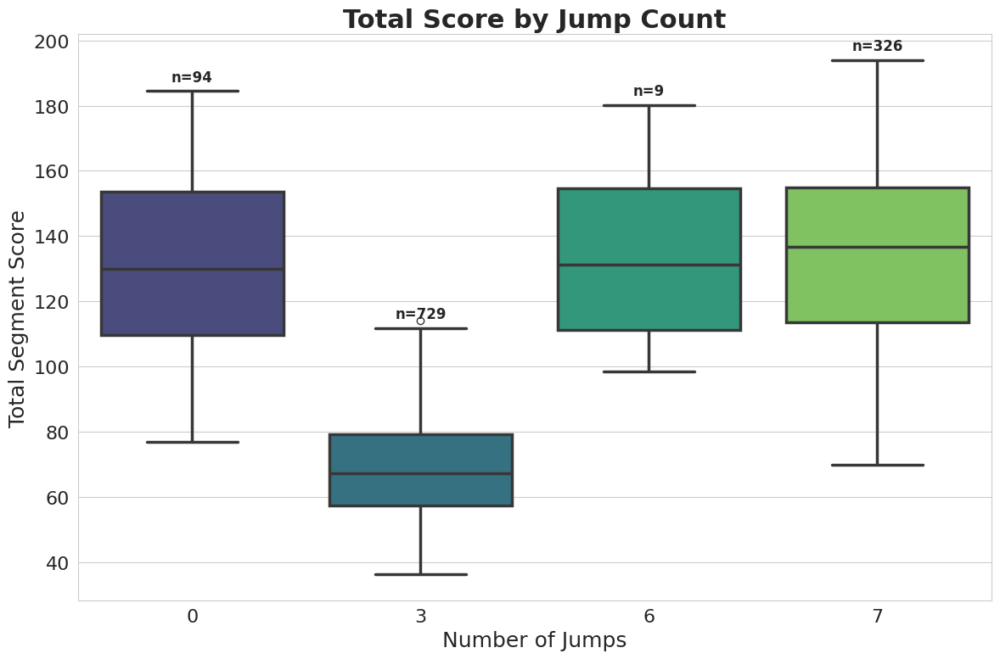

In [ ]:

plt.figure(figsize=(12, 8))

ax = sns.boxplot(
    x='jump_count',
    y='total_segment_score',
    data=df_cleaned,
    palette='viridis',
    linewidth=2.5
)

plt.title('Total Score by Jump Count', fontsize=22, fontweight='bold')
plt.xlabel('Number of Jumps', fontsize=18)
plt.ylabel('Total Segment Score', fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)


grouped = df_cleaned.groupby('jump_count')['total_segment_score']
for i, jump_count in enumerate(sorted(df_cleaned['jump_count'].unique())):
    data = grouped.get_group(jump_count)
    q1 = data.quantile(0.25)
    q3 = data.quantile(0.75)
    iqr = q3 - q1
    upper_whisker = min(data.max(), q3 + 1.5 * iqr)

    count = len(data)
    ax.text(i, upper_whisker + 2, f'n={count}', ha='center', va='bottom', fontsize=12, fontweight='bold')

plt.tight_layout()
plt.show()


<ipython-input-28-f73621dc8f43>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


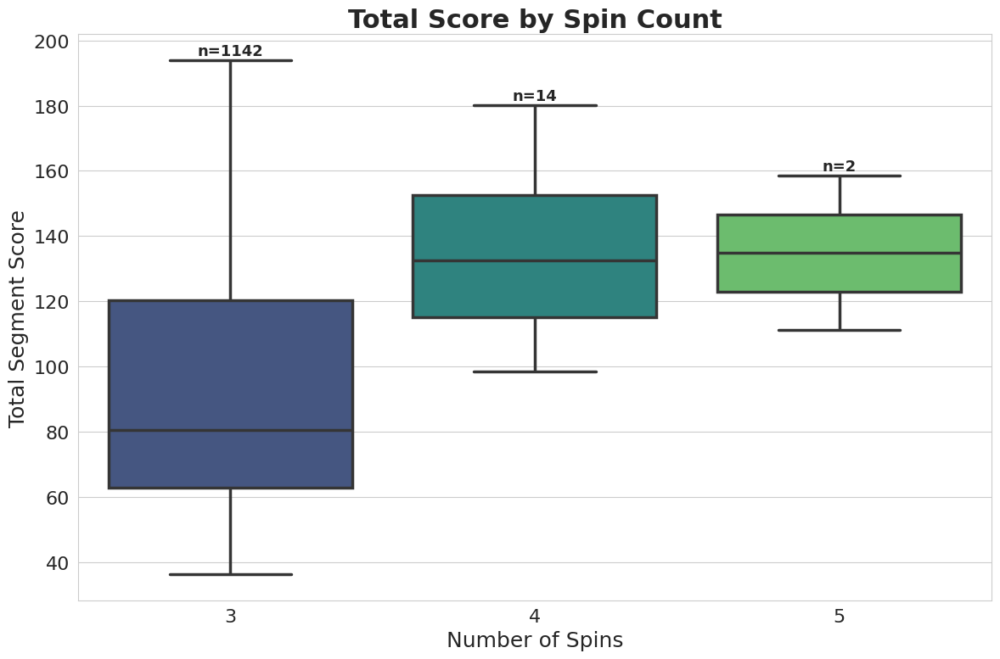

In [ ]:
plt.figure(figsize=(12, 8))

ax = sns.boxplot(
    x='spin_count',
    y='total_segment_score',
    data=df_cleaned,
    palette='viridis',
    linewidth=2.5
)

plt.title('Total Score by Spin Count', fontsize=22, fontweight='bold')
plt.xlabel('Number of Spins', fontsize=18)
plt.ylabel('Total Segment Score', fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)


for i, spin_count in enumerate(sorted(df_cleaned['spin_count'].unique())):
    count = len(df_cleaned[df_cleaned['spin_count'] == spin_count])
    line_index = i * 6 + 1  # 2nd line in each group of 6 = top whisker
    top_whisker_line = ax.lines[line_index]
    whisker_y = top_whisker_line.get_ydata()[1]  # Top y of the whisker
    ax.text(i, whisker_y + 0.5, f'n={count}', ha='center', va='bottom', fontsize=13, fontweight='bold')

plt.tight_layout()
plt.show()


<ipython-input-29-3e53141c1e6a>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


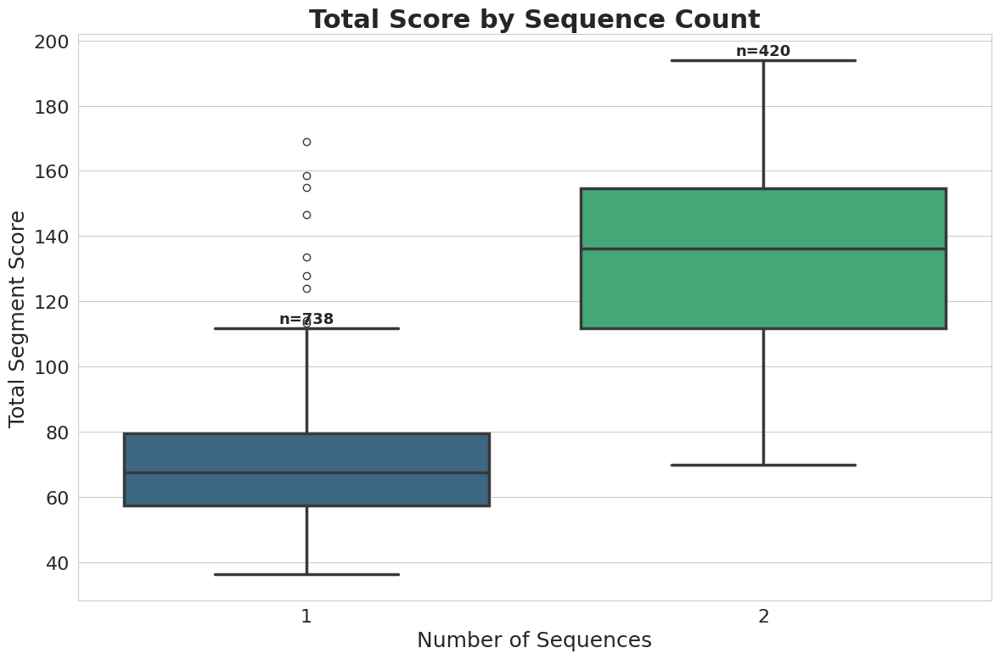

In [ ]:
plt.figure(figsize=(12, 8))

ax = sns.boxplot(
    x='sequence_count',
    y='total_segment_score',
    data=df_cleaned,
    palette='viridis',
    linewidth=2.5
)

plt.title('Total Score by Sequence Count', fontsize=22, fontweight='bold')
plt.xlabel('Number of Sequences', fontsize=18)
plt.ylabel('Total Segment Score', fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)


for i, seq_count in enumerate(sorted(df_cleaned['sequence_count'].unique())):
    count = len(df_cleaned[df_cleaned['sequence_count'] == seq_count])
    line_index = i * 6 + 1
    top_whisker_line = ax.lines[line_index]
    whisker_y = top_whisker_line.get_ydata()[1]
    ax.text(i, whisker_y + 0.5, f'n={count}', ha='center', va='bottom', fontsize=13, fontweight='bold')

plt.tight_layout()
plt.show()


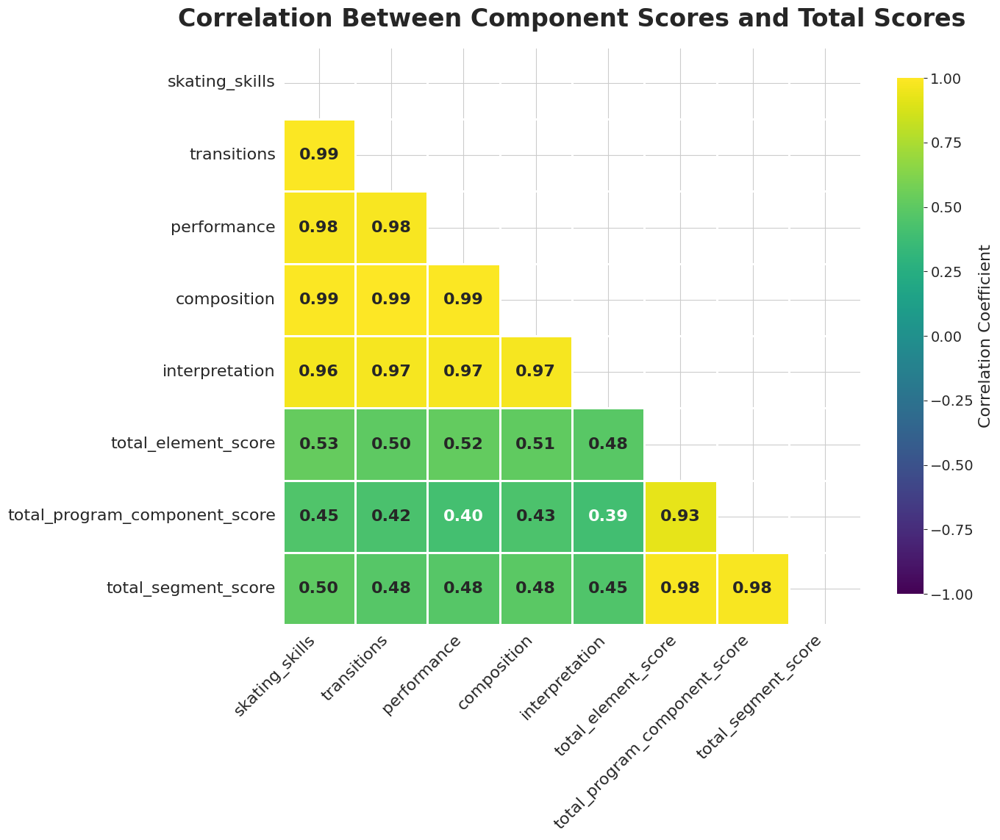

In [ ]:

component_cols = ['skating_skills', 'transitions', 'performance', 'composition', 'interpretation']


if all(col in df_cleaned.columns for col in component_cols):
    plt.figure(figsize=(14, 12))

    corr = df_cleaned[component_cols + ['total_element_score', 'total_program_component_score', 'total_segment_score']].corr()
    mask = np.triu(np.ones_like(corr, dtype=bool))

    sns.heatmap(
        corr,
        annot=True,
        fmt=".2f",
        cmap='viridis',
        mask=mask,
        vmin=-1,
        vmax=1,
        square=True,
        linewidths=1.0,
        annot_kws={"size": 16, "weight": "bold"},
        cbar_kws={"shrink": .8, "label": "Correlation Coefficient"}
    )

    plt.title('Correlation Between Component Scores and Total Scores', fontsize=24, fontweight='bold', pad=20)
    plt.xticks(fontsize=16, rotation=45, ha='right')
    plt.yticks(fontsize=16)

    plt.tight_layout()
    plt.show()
else:
    print("Some component columns are missing from the dataframe. Please check your data.")

<ipython-input-35-b378de3069e8>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
<ipython-input-35-b378de3069e8>:6: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


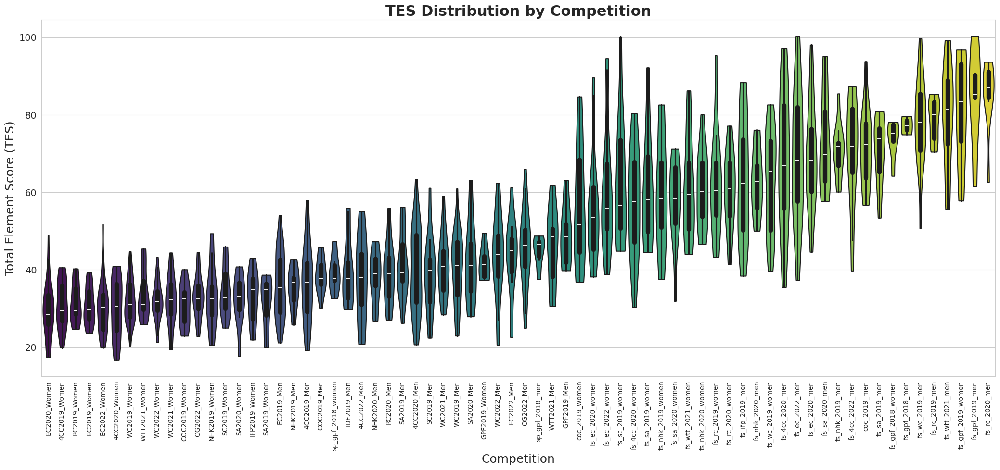

In [ ]:

plt.figure(figsize=(max(14, len(df_cleaned['competition'].unique()) * 0.3), 10))  # dynamic width


order = df_cleaned.groupby("competition")["total_element_score"].median().sort_values().index

ax = sns.violinplot(
    x='competition',
    y='total_element_score',
    data=df_cleaned,
    palette='viridis',
    inner='box',
    linewidth=1.5,
    cut=0,
    scale='width',
    order=order
)

plt.title('TES Distribution by Competition', fontsize=22, fontweight='bold')
plt.xlabel('Competition', fontsize=18)
plt.ylabel('Total Element Score (TES)', fontsize=18)
plt.xticks(rotation=90, fontsize=10, ha='center')
plt.yticks(fontsize=14)

plt.tight_layout()
plt.show()


<ipython-input-37-c1b38fdbb21f>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
<ipython-input-37-c1b38fdbb21f>:7: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(


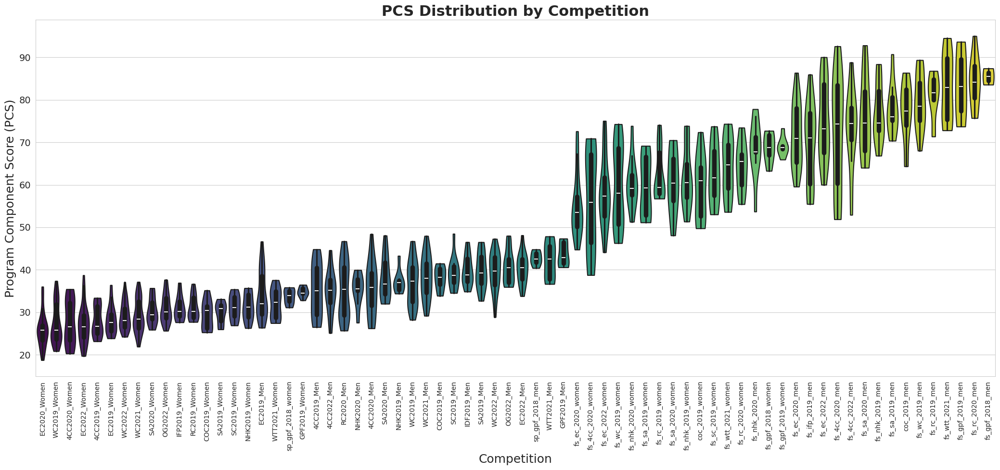

In [ ]:
plt.figure(figsize=(max(14, len(df_cleaned['competition'].unique()) * 0.3), 10))


order = df_cleaned.groupby("competition")["total_program_component_score"].median().sort_values().index


sns.violinplot(
    x='competition',
    y='total_program_component_score',
    data=df_cleaned,
    palette='viridis',
    inner='box',
    linewidth=1.5,
    cut=0,
    scale='width',
    order=order
)

plt.title('PCS Distribution by Competition', fontsize=22, fontweight='bold')
plt.xlabel('Competition', fontsize=18)
plt.ylabel('Program Component Score (PCS)', fontsize=18)
plt.xticks(rotation=90, fontsize=10, ha='center')
plt.yticks(fontsize=14)

plt.tight_layout()
plt.show()


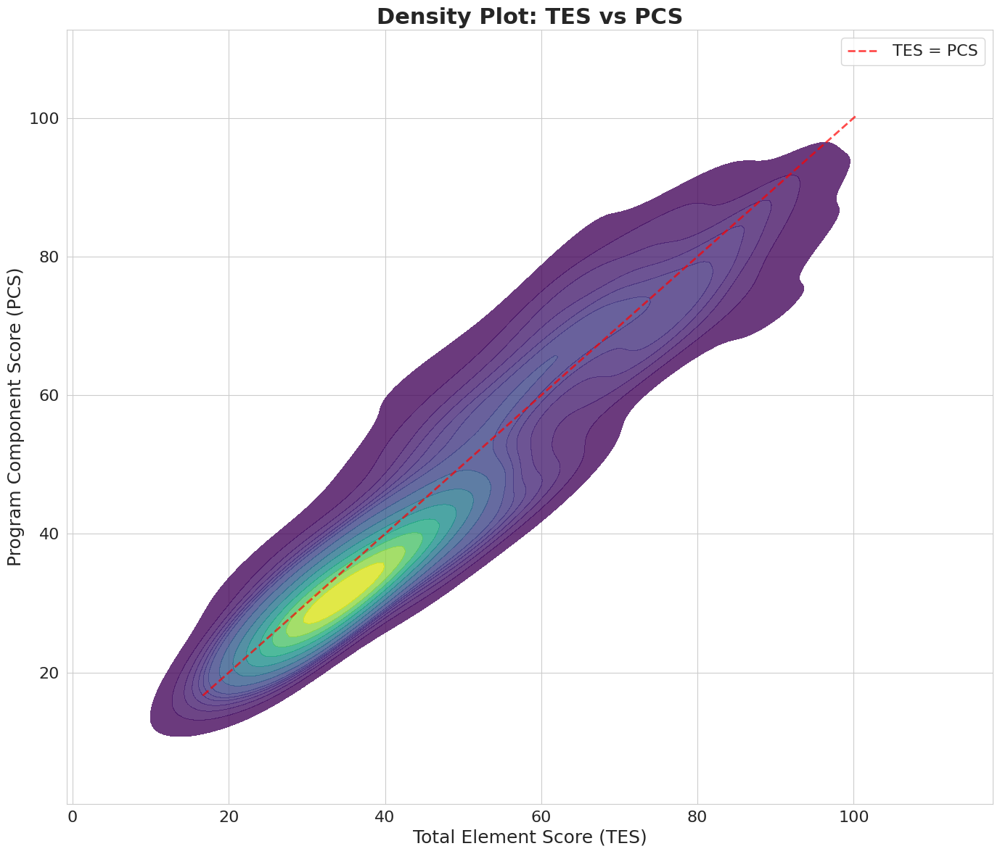

In [ ]:

plt.figure(figsize=(14, 12))


sns.kdeplot(
    data=df_cleaned,
    x='total_element_score',
    y='total_program_component_score',
    fill=True,
    thresh=0.05,
    cmap='viridis',
    levels=15,
    alpha=0.8
)




min_val = min(df_cleaned['total_element_score'].min(), df_cleaned['total_program_component_score'].min())
max_val = max(df_cleaned['total_element_score'].max(), df_cleaned['total_program_component_score'].max())
plt.plot([min_val, max_val], [min_val, max_val], 'r--', linewidth=2, alpha=0.7, label='TES = PCS')

plt.title('Density Plot: TES vs PCS', fontsize=22, fontweight='bold')
plt.xlabel('Total Element Score (TES)', fontsize=18)
plt.ylabel('Program Component Score (PCS)', fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(fontsize=16)

plt.tight_layout()
plt.show()

<Figure size 1400x1400 with 0 Axes>

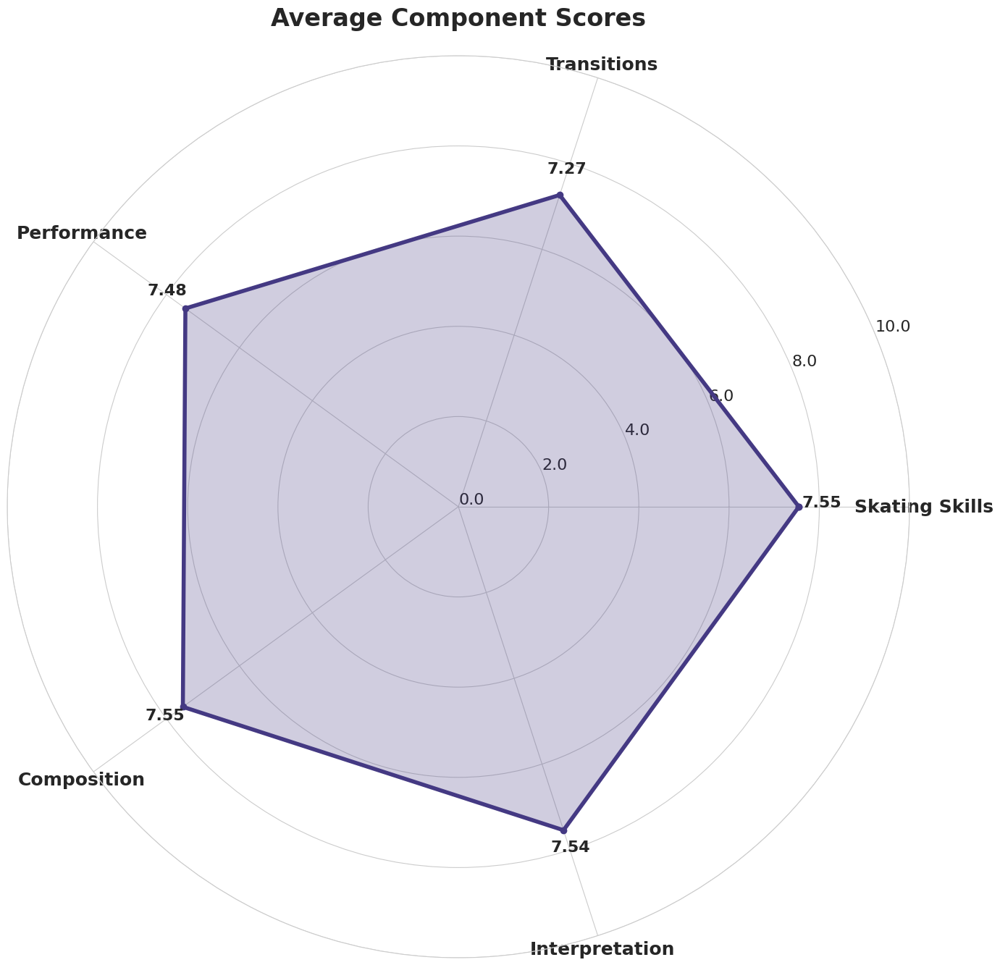

In [ ]:

component_cols = ['skating_skills', 'transitions', 'performance', 'composition', 'interpretation']


if all(col in df_cleaned.columns for col in component_cols):
    plt.figure(figsize=(14, 14))


    component_means = [df_cleaned[col].mean() for col in component_cols]


    angles = np.linspace(0, 2*np.pi, len(component_cols), endpoint=False).tolist()
    angles += angles[:1]

    component_means += [component_means[0]]
    component_names = [col.replace('_', ' ').title() for col in component_cols]

    fig, ax = plt.subplots(figsize=(14, 14), subplot_kw=dict(polar=True))


    ax.plot(angles, component_means, 'o-', linewidth=4, color=colors[0])
    ax.fill(angles, component_means, alpha=0.25, color=colors[0])


    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(component_names, fontsize=18, fontweight='bold')


    ax.set_yticks(np.arange(0, 10.5, 2))
    ax.set_yticklabels([f"{i:.1f}" for i in np.arange(0, 10.5, 2)], fontsize=16)
    ax.set_ylim(0, 10)


    for i, (angle, score) in enumerate(zip(angles[:-1], component_means[:-1])):
        ax.text(angle, score + 0.5, f'{score:.2f}',
                fontsize=16, fontweight='bold', ha='center')

    plt.title('Average Component Scores', fontsize=24, fontweight='bold', pad=30)

    plt.tight_layout()
    plt.show()
else:
    print("Some component columns are missing from the dataframe. Please check your data.")

<ipython-input-33-531fb034dcae>:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
<ipython-input-33-531fb034dcae>:14: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(


Saved figure 6: GOE comparison by element type


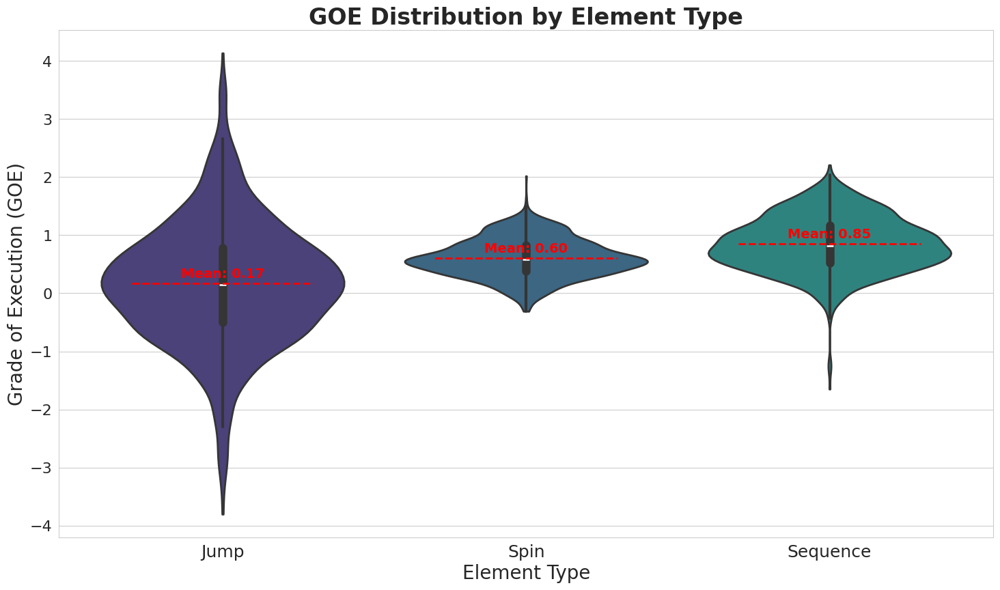

In [ ]:

    plt.figure(figsize=(16, 10))


    goe_df = pd.DataFrame({
        'Element Type': ['Jump']*len(df) + ['Spin']*len(df) + ['Sequence']*len(df),
        'GOE': df['avg_jump_goe'].tolist() + df['avg_spin_goe'].tolist() + df['avg_sequence_goe'].tolist()
    })


    goe_df = goe_df[goe_df['GOE'] != 0]


    sns.violinplot(
        x='Element Type',
        y='GOE',
        data=goe_df,
        palette=colors[:3],
        inner='box',
        cut=0,
        linewidth=2,
        scale='width'
    )



    for i, elem_type in enumerate(['Jump', 'Spin', 'Sequence']):
        subset = goe_df[goe_df['Element Type'] == elem_type]
        if not subset.empty:
            mean_val = subset['GOE'].mean()
            plt.hlines(y=mean_val, xmin=i-0.3, xmax=i+0.3, color='red', linestyle='--', linewidth=2)
            plt.text(i, mean_val + 0.1, f'Mean: {mean_val:.2f}',
                    ha='center', fontsize=14, fontweight='bold', color='red')

    plt.title('GOE Distribution by Element Type', fontsize=24, fontweight='bold')
    plt.xlabel('Element Type', fontsize=20)
    plt.ylabel('Grade of Execution (GOE)', fontsize=20)
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=16)

    plt.tight_layout(pad=4.0)
    plt.savefig('figure_skating_plots/figure_skating_analysis_6.png', dpi=300, bbox_inches='tight')
    print("Saved figure 6: GOE comparison by element type")

# Annotataion Analysis

Dataset shape: (10359, 16)

Basic statistics:
             factor    deductions     jump_comb            bv           goe  \
count  10359.000000  10359.000000  10359.000000  10359.000000  10359.000000   
mean       1.339396     -0.449754     -0.268173      4.979495      0.417674   
std        0.464362      0.784061      0.859003      2.888954      1.239768   
min        0.800000     -6.000000     -1.000000      0.000000     -5.750000   
25%        0.800000     -1.000000     -1.000000      3.000000      0.110000   
50%        1.600000      0.000000      0.000000      3.500000      0.600000   
75%        1.600000      0.000000      0.000000      6.490000      1.010000   
max        2.000000      2.000000      4.000000     17.270000      6.660000   

       score_of_panel  skating_skills_score  transitions_score  \
count    10359.000000          10359.000000       10359.000000   
mean         5.548961              7.595765           7.310712   
std         16.353957              1.003469 

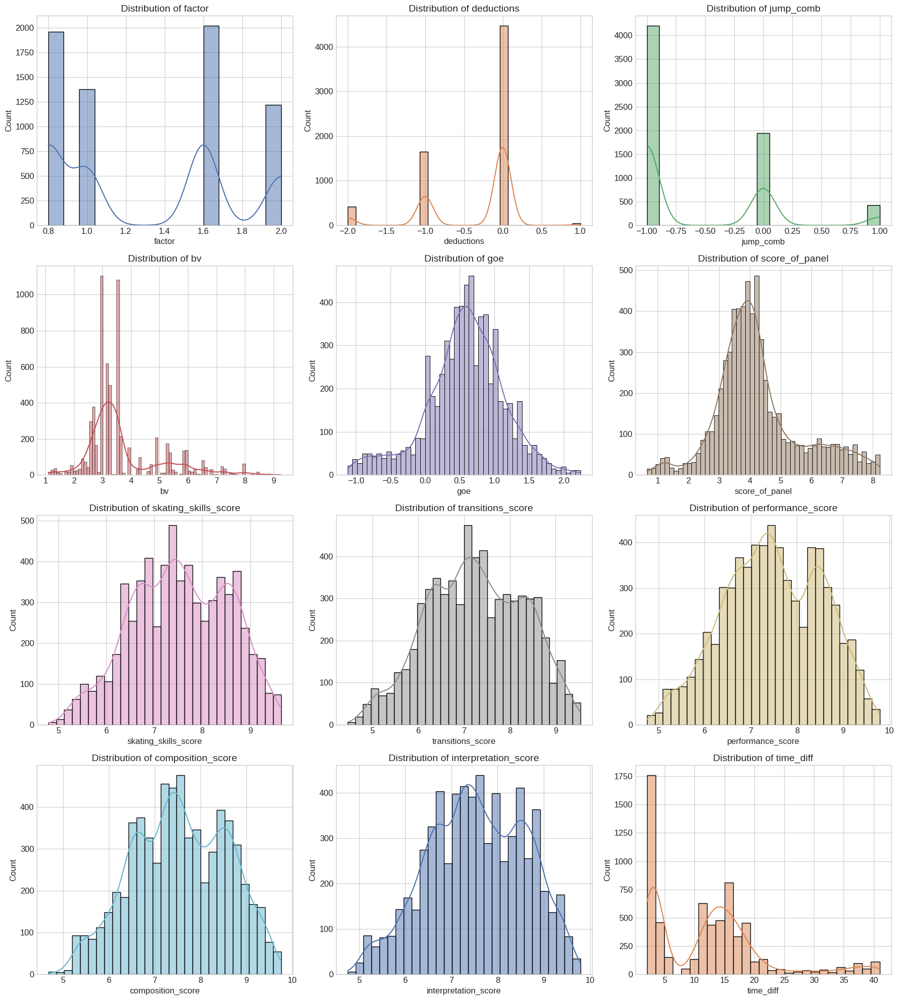

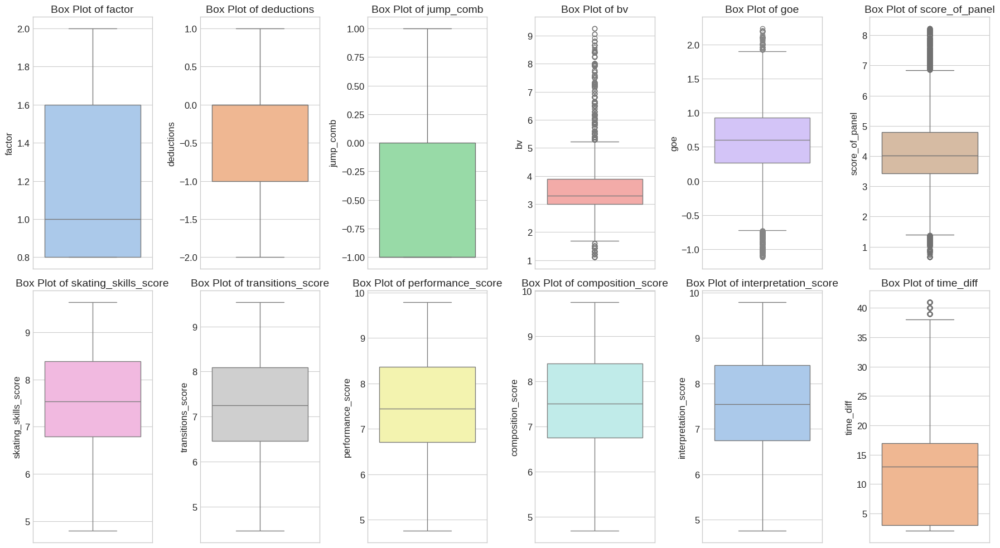

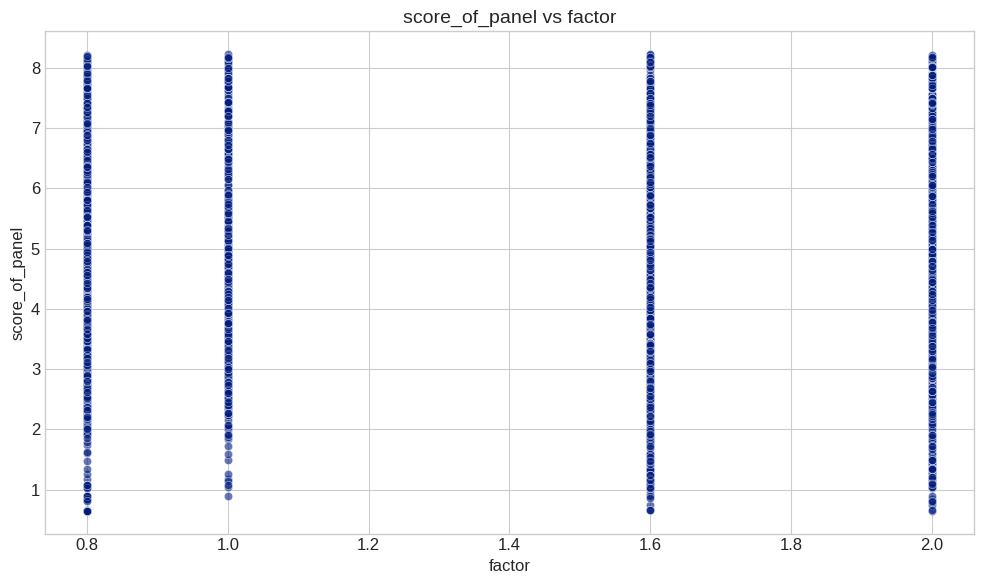

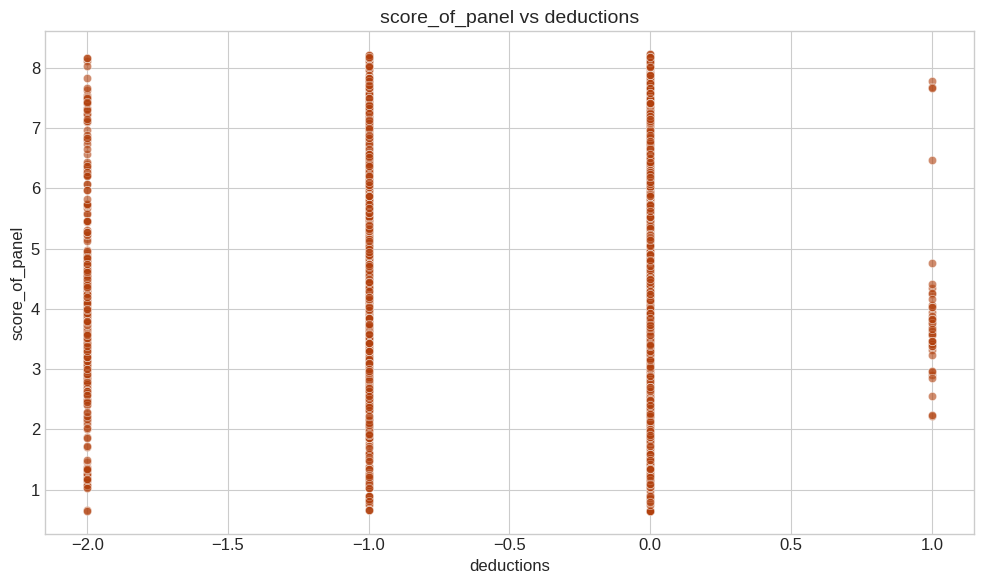

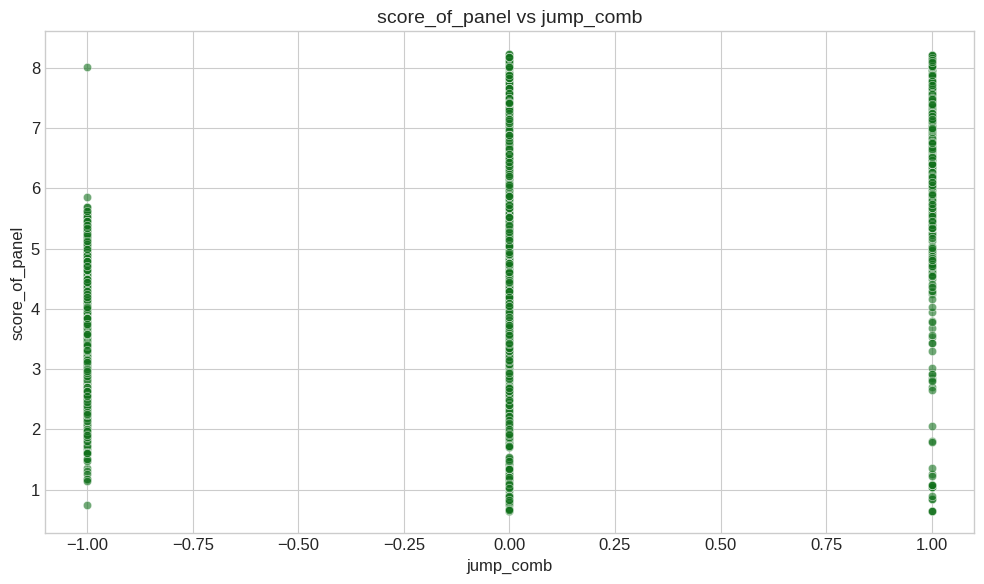

...

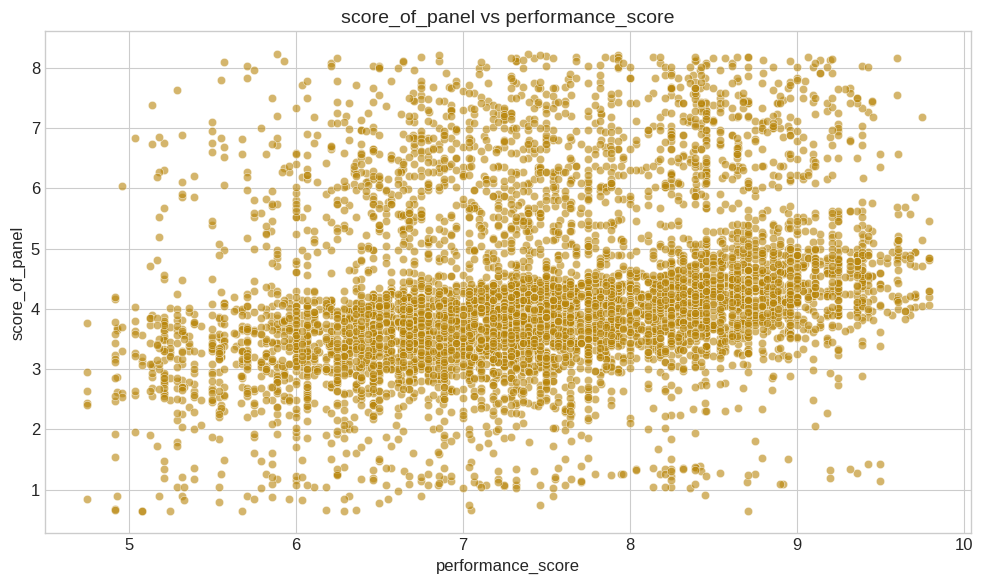

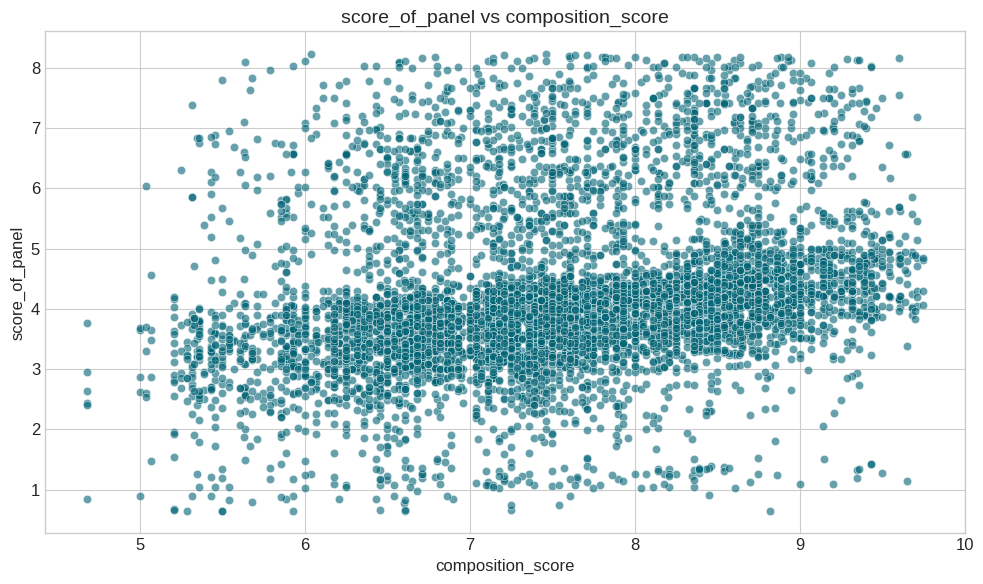

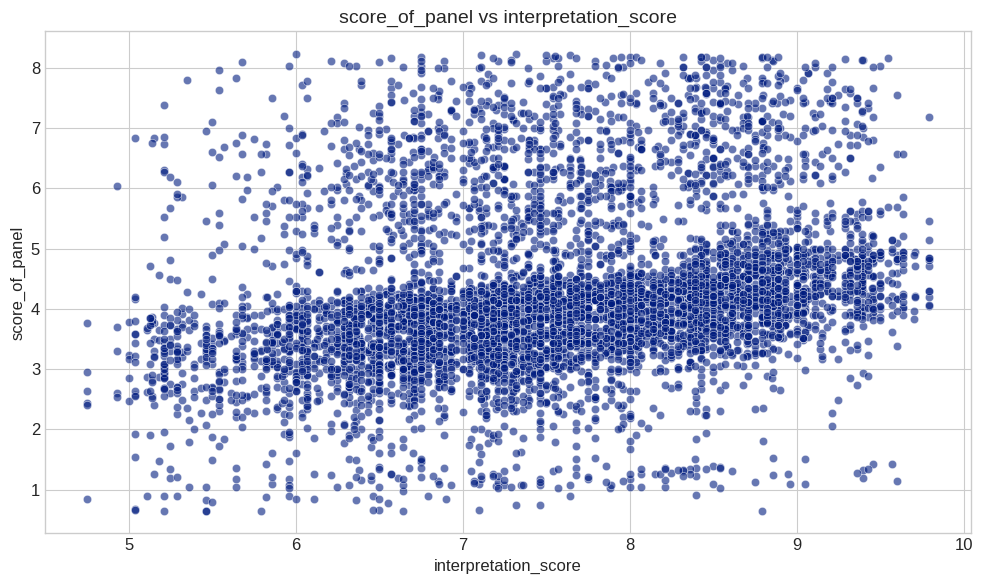

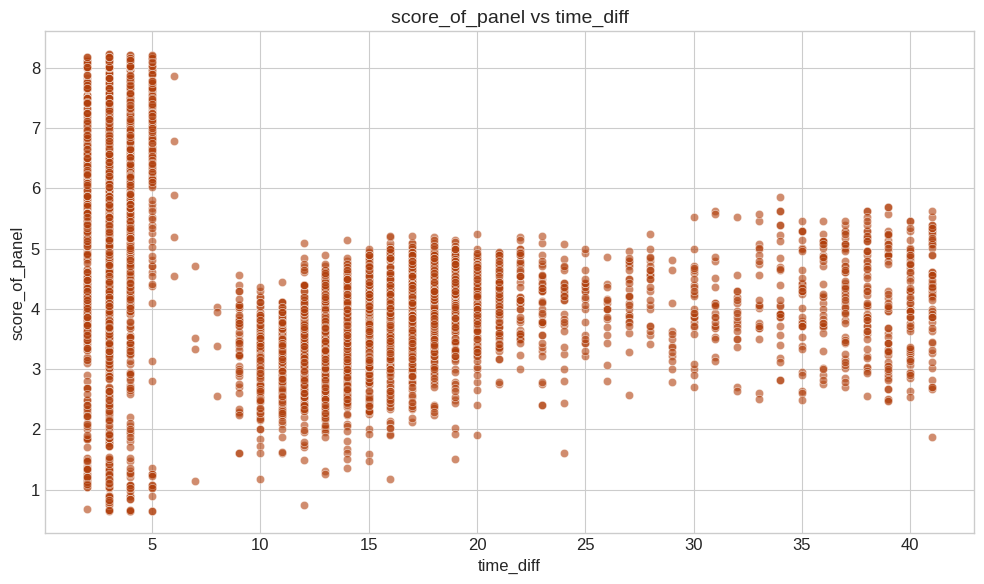

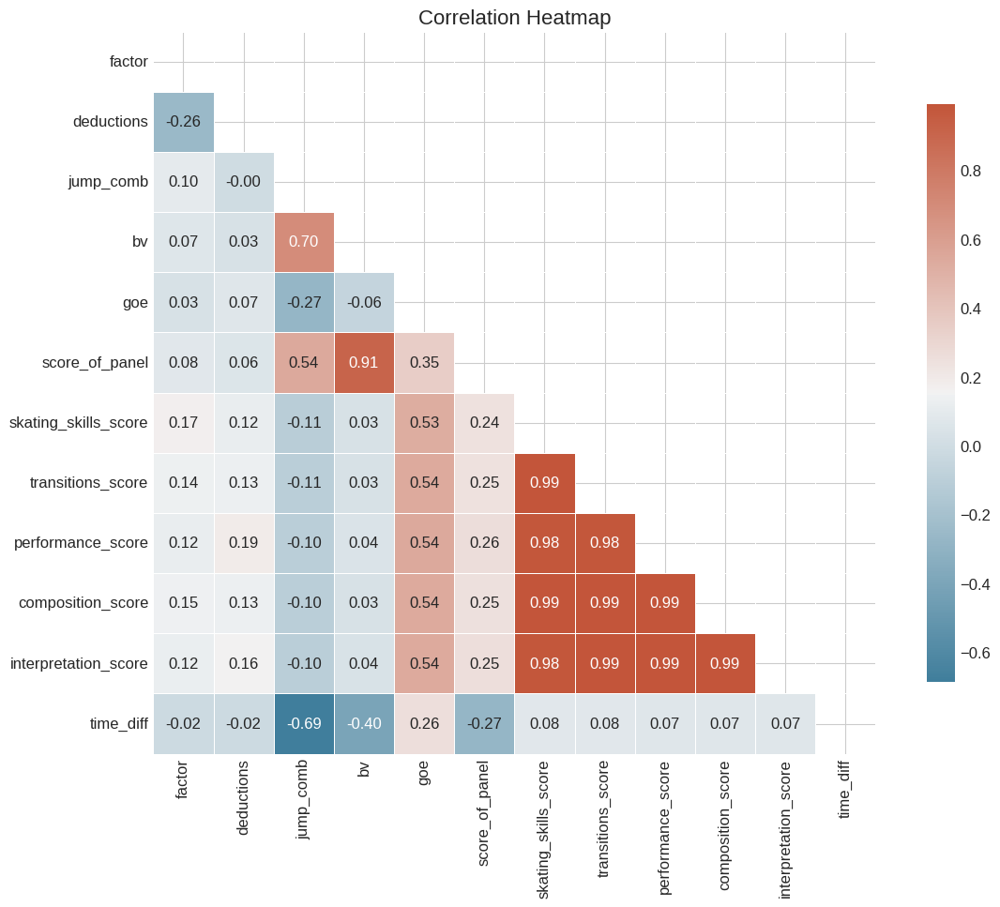

<Figure size 1000x800 with 0 Axes>

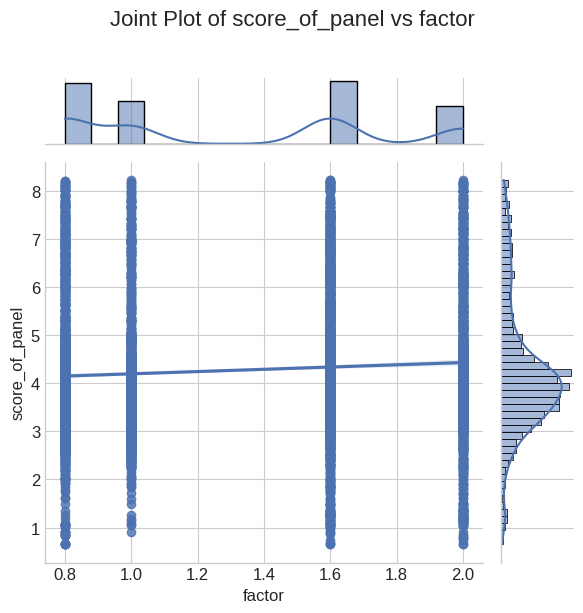

<Figure size 1000x800 with 0 Axes>

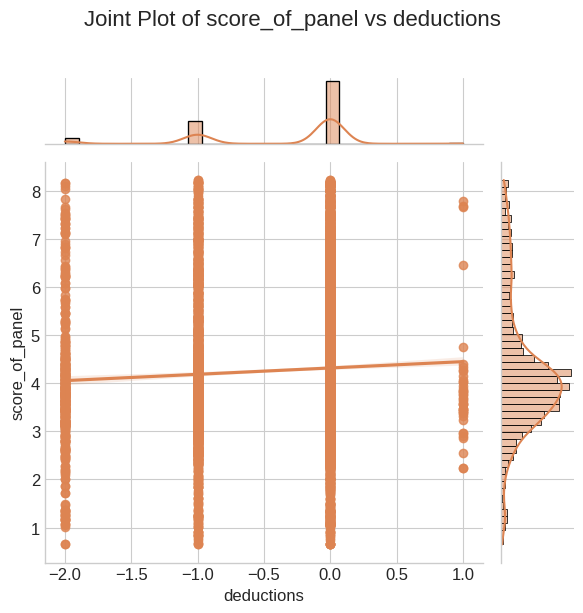

<Figure size 1000x800 with 0 Axes>

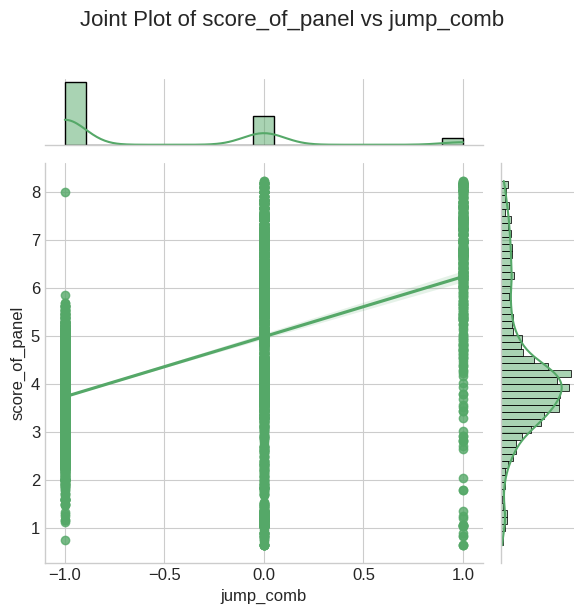

<Figure size 1000x800 with 0 Axes>

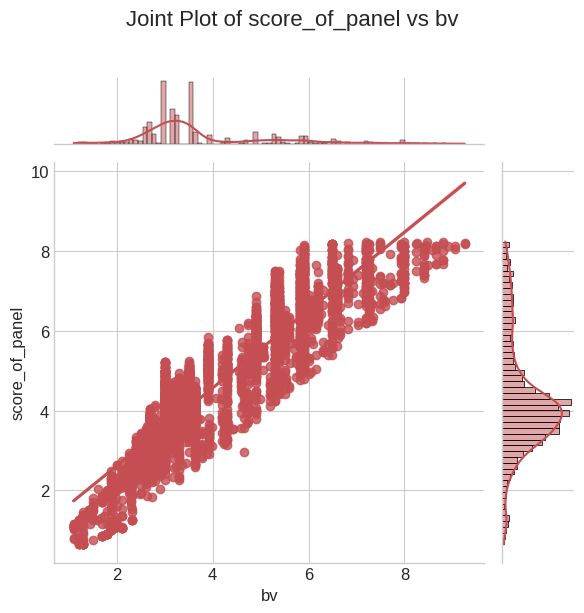

<Figure size 1000x800 with 0 Axes>

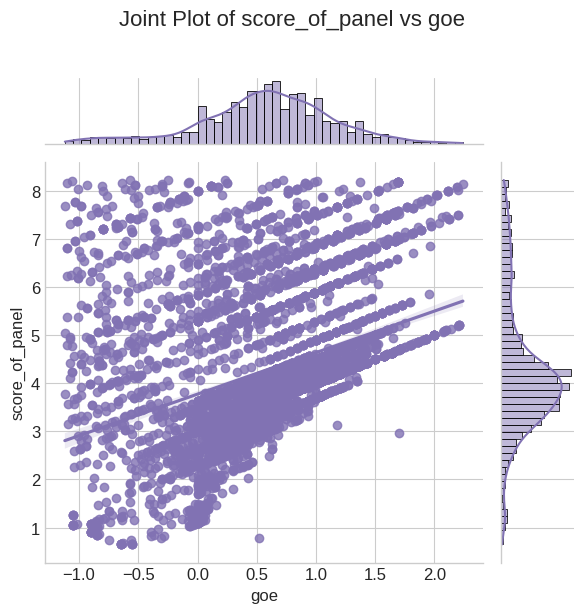

<Figure size 1600x1200 with 0 Axes>

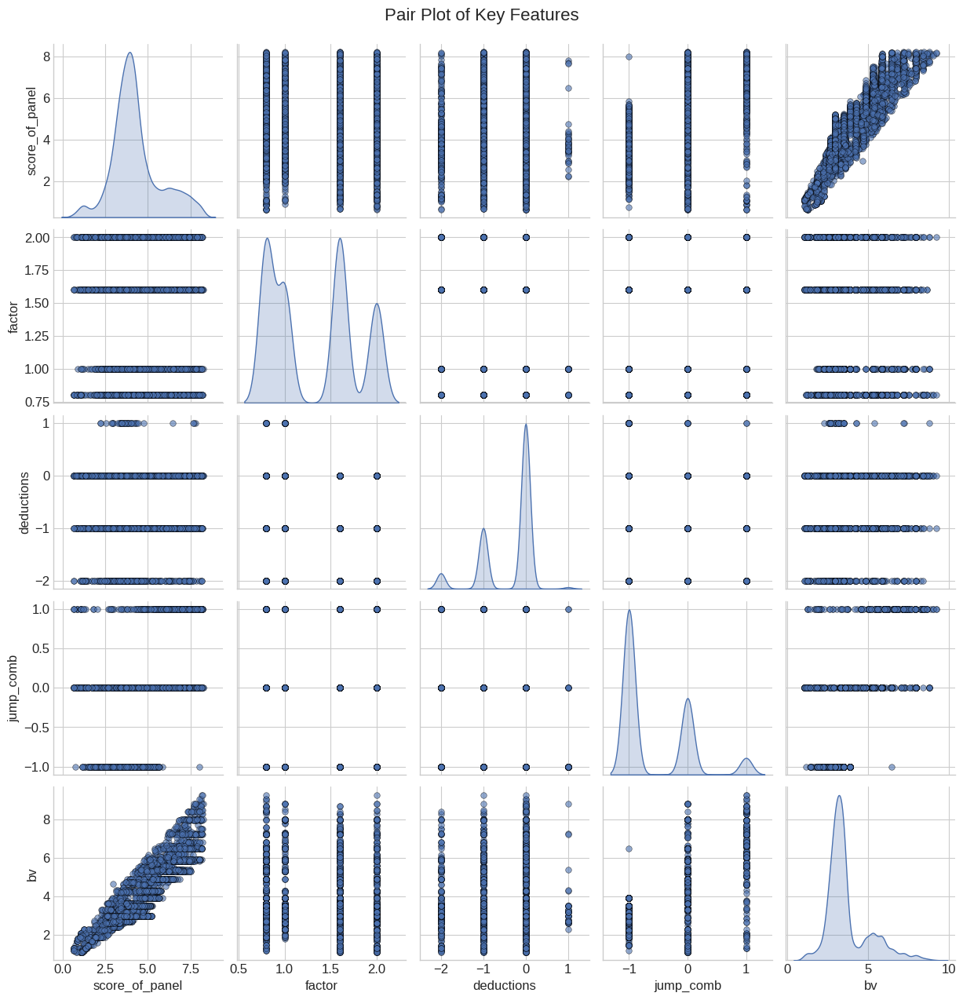

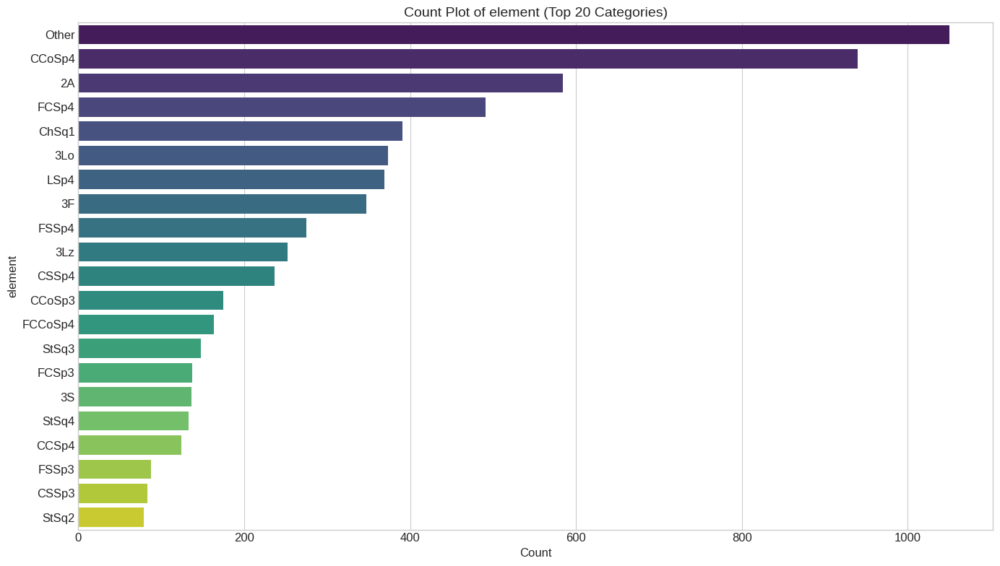

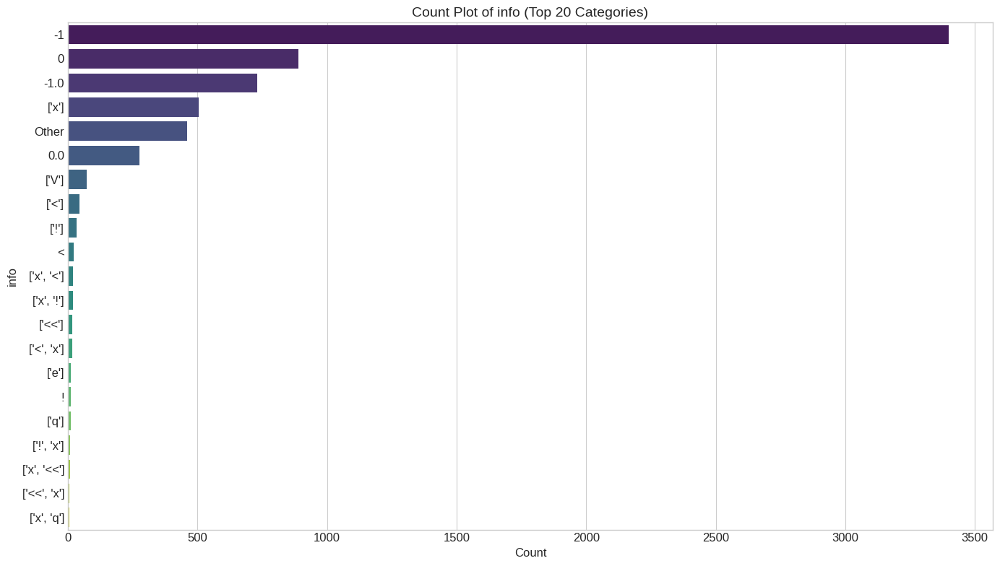

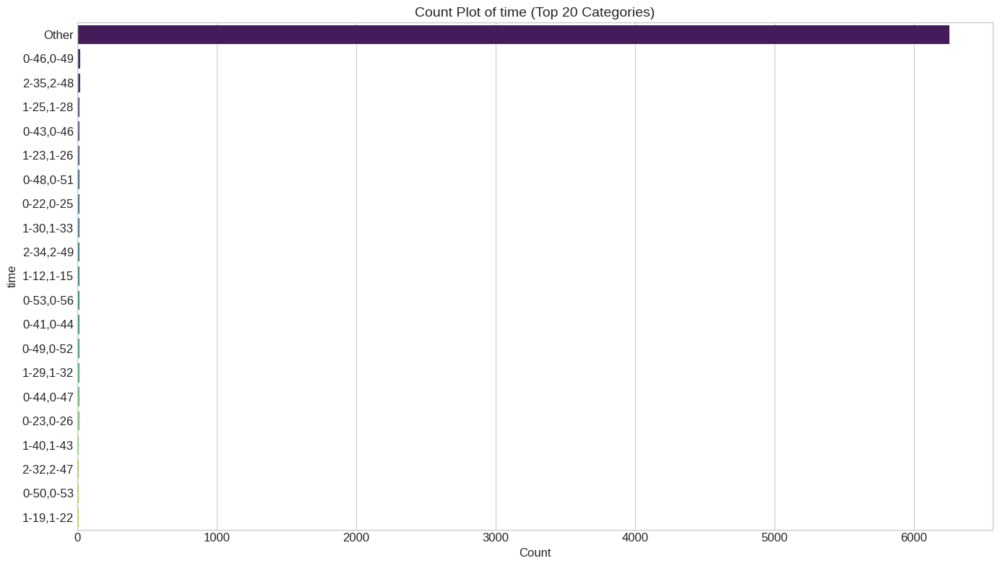

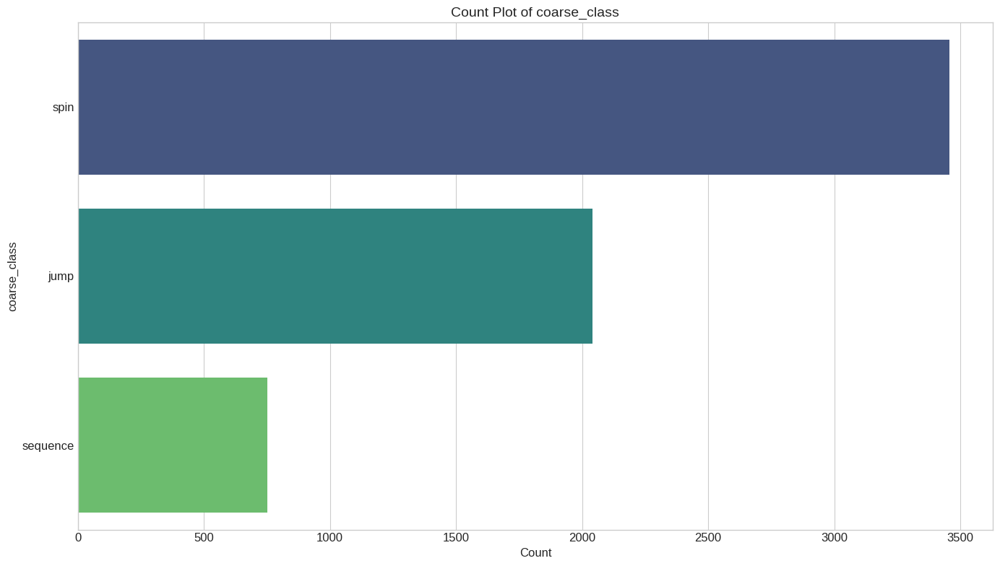


==== Data Preprocessing for Experiment 1 ====
Features: ['factor', 'deductions', 'element', 'jump_comb', 'goe', 'time_diff', 'coarse_class']
X shape: (6575, 7), y shape: (6575,)
Encoded element with 120 unique values
Encoded coarse_class with 4 unique values
Train set: (5260, 7), Test set: (1315, 7)

==== Model Training and Evaluation for Experiment 1 ====
Training Linear Regression...


<Figure size 1000x800 with 0 Axes>

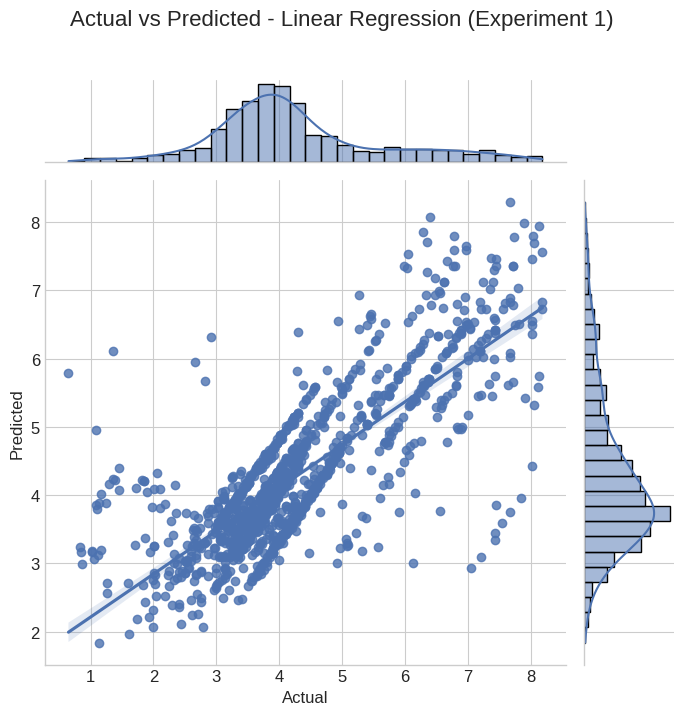

Training Ridge Regression...


<Figure size 1000x800 with 0 Axes>

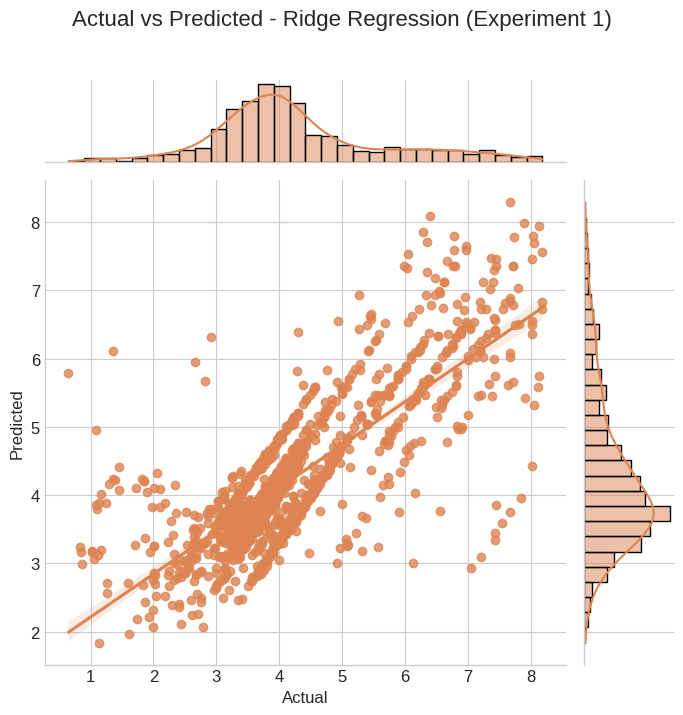

Training Lasso Regression...


<Figure size 1000x800 with 0 Axes>

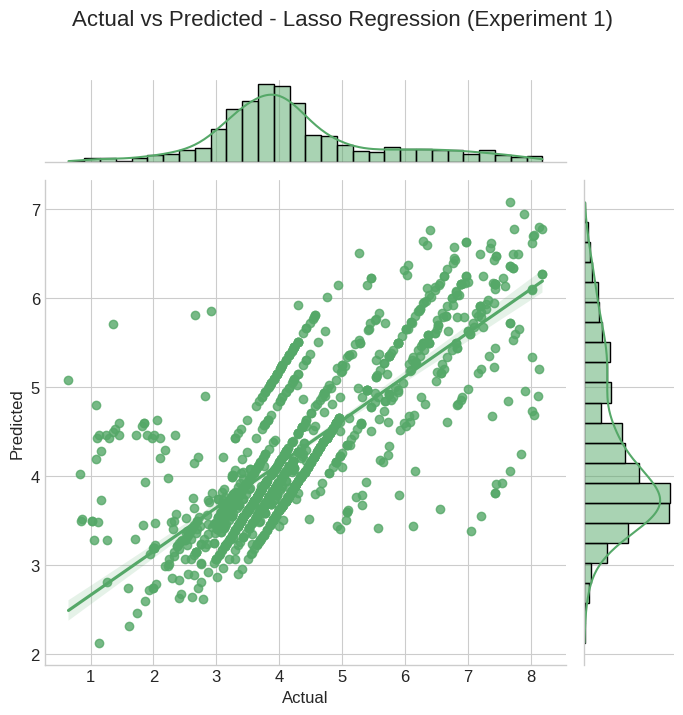

Training Elastic Net...


<Figure size 1000x800 with 0 Axes>

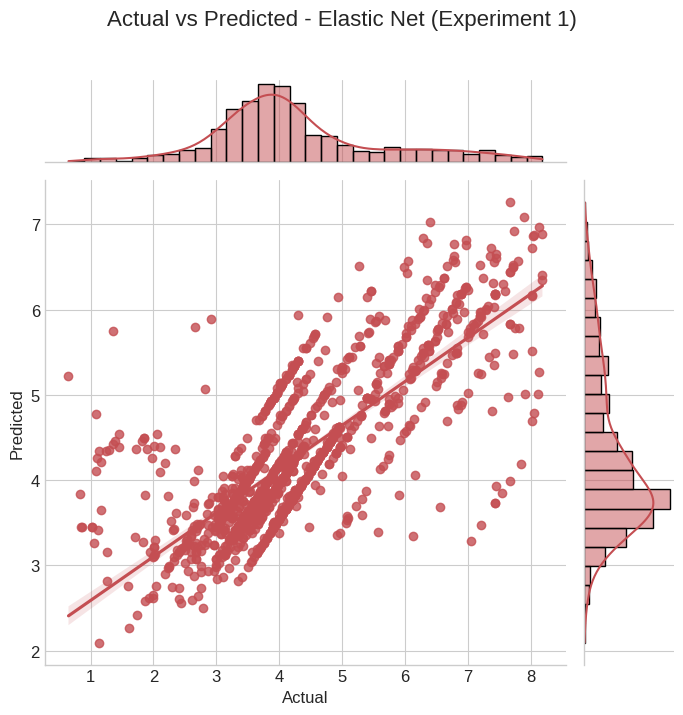

Training Random Forest...


<Figure size 1000x800 with 0 Axes>

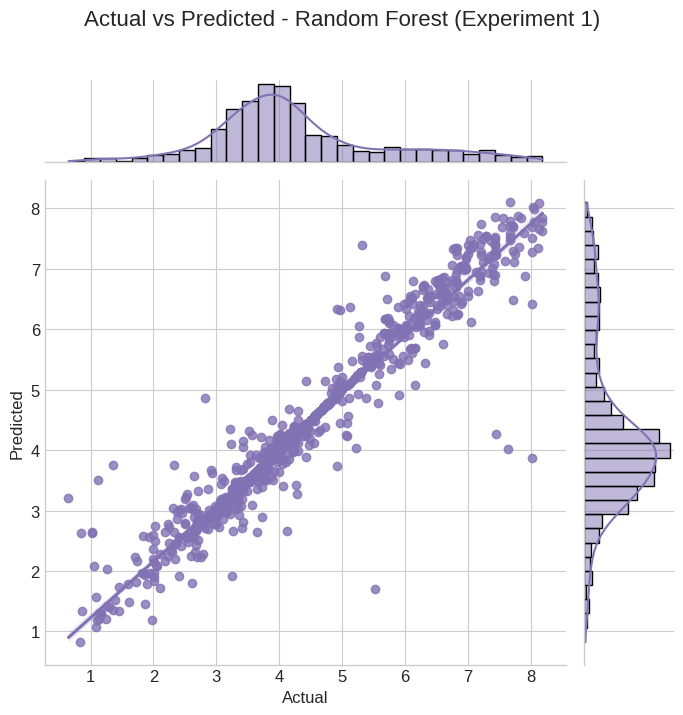

Training Gradient Boosting...


<Figure size 1000x800 with 0 Axes>

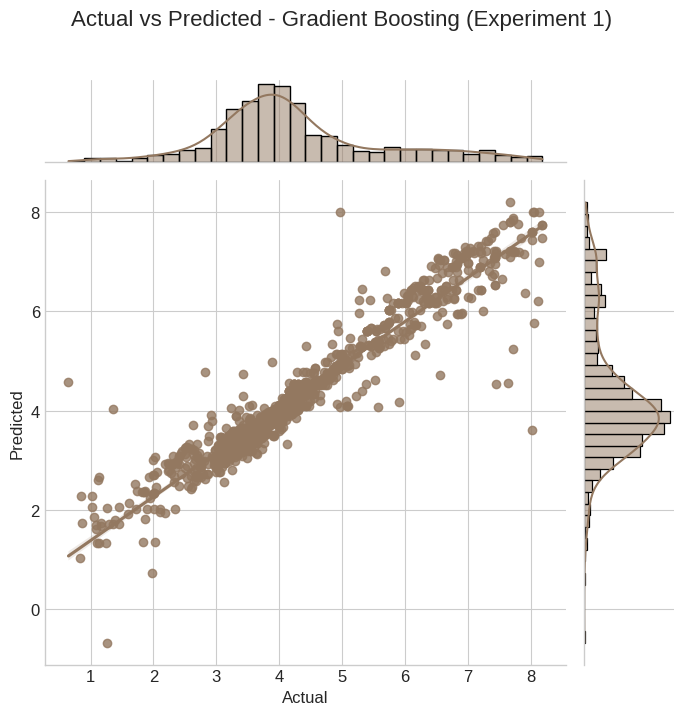

Training XGBoost...


<Figure size 1000x800 with 0 Axes>

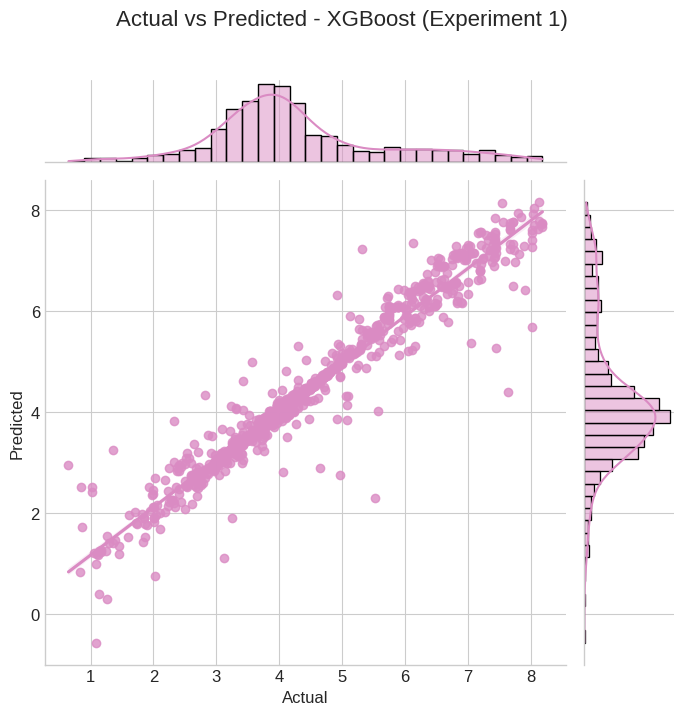

Training SVR...


<Figure size 1000x800 with 0 Axes>

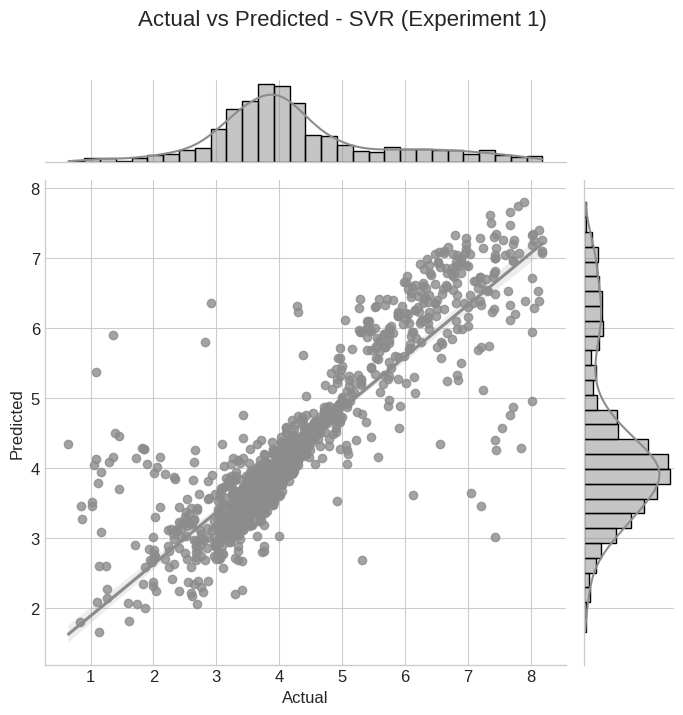

Training K-Neighbors...


<Figure size 1000x800 with 0 Axes>

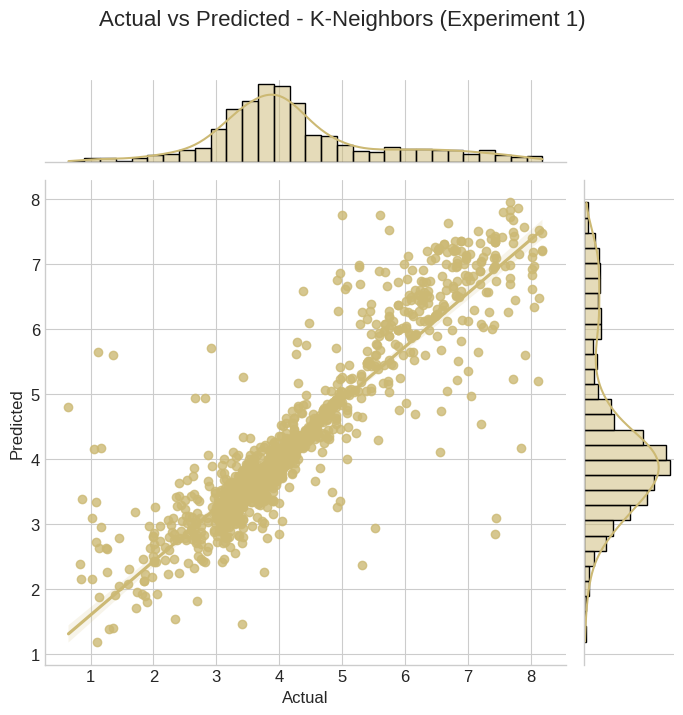

Training AdaBoost...


<Figure size 1000x800 with 0 Axes>

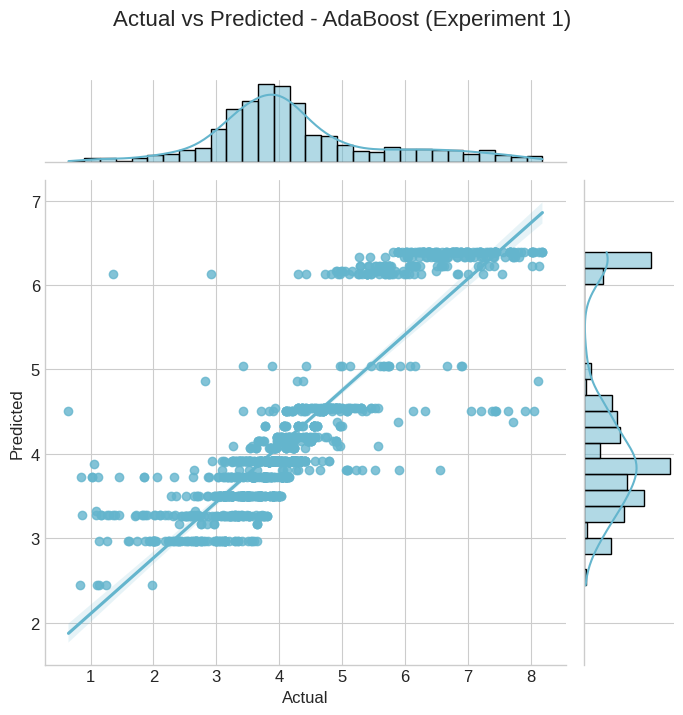


==== Model Comparison for Experiment 1 ====
               Model       MAE       MSE      RMSE  R2_Score  CV_R2_Mean  \
0            XGBoost  0.152478  0.112107  0.334825  0.941541    0.918228   
1      Random Forest  0.152508  0.134500  0.366743  0.929864    0.913408   
2  Gradient Boosting  0.227213  0.168661  0.410683  0.912051    0.895392   
3        K-Neighbors  0.333997  0.369851  0.608154  0.807140    0.752851   
4                SVR  0.364679  0.441188  0.664220  0.769940    0.723620   
5           AdaBoost  0.462306  0.488560  0.698971  0.745238    0.718550   
6   Ridge Regression  0.594674  0.731202  0.855103  0.618711    0.596347   
7  Linear Regression  0.594668  0.731263  0.855139  0.618679    0.596345   
8        Elastic Net  0.605146  0.785708  0.886402  0.590289    0.562549   
9   Lasso Regression  0.617925  0.825033  0.908313  0.569783    0.541916   

   CV_R2_Std  
0   0.010233  
1   0.008860  
2   0.023847  
3   0.015207  
4   0.025714  
5   0.013979  
6   0.027323 

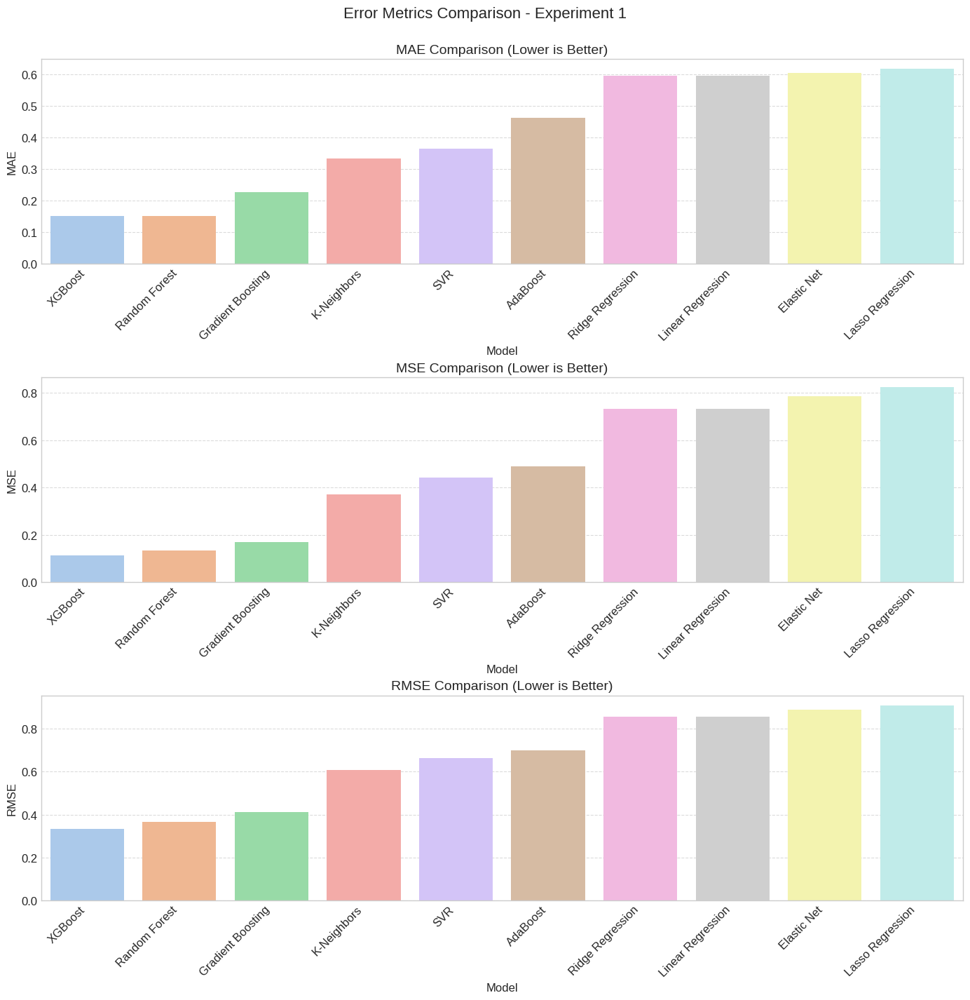

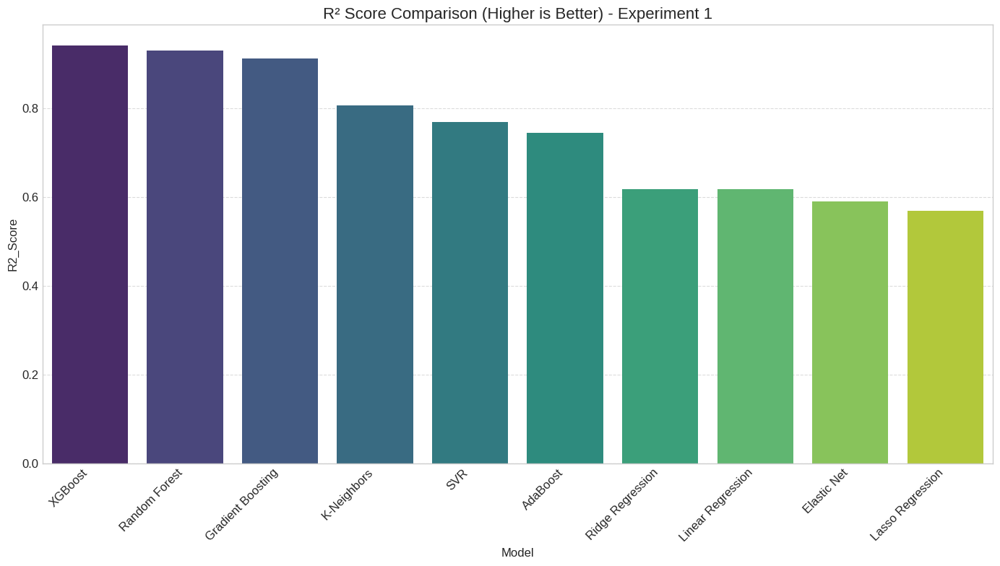

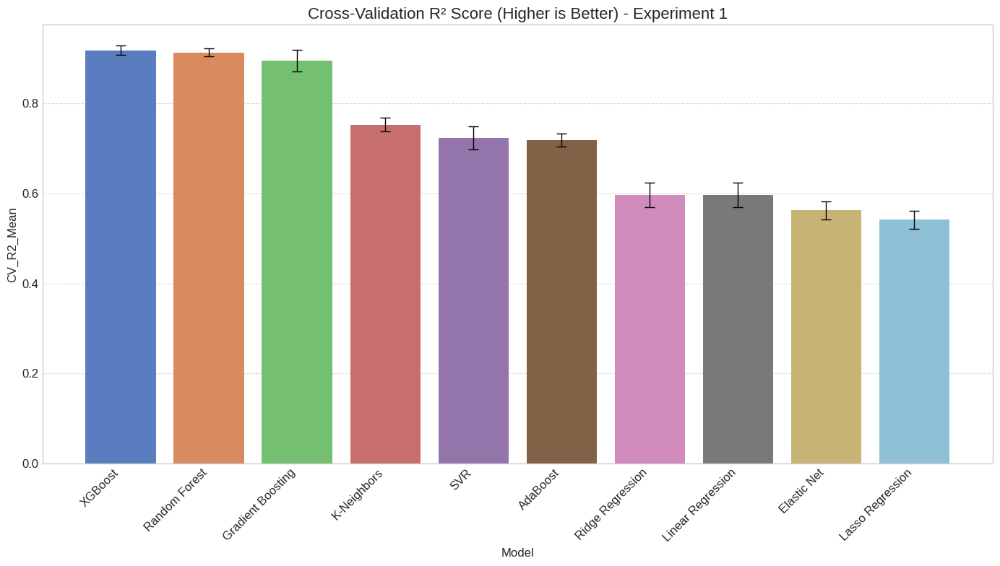


==== Data Preprocessing for Experiment 2 ====
Features: ['factor', 'deductions', 'element', 'jump_comb', 'goe', 'time_diff', 'coarse_class', 'skating_skills_score', 'transitions_score', 'performance_score', 'composition_score', 'interpretation_score']
X shape: (6575, 12), y shape: (6575,)
Encoded element with 120 unique values
Encoded coarse_class with 4 unique values
Train set: (5260, 12), Test set: (1315, 12)

==== Model Training and Evaluation for Experiment 2 ====
Training Linear Regression...


<Figure size 1000x800 with 0 Axes>

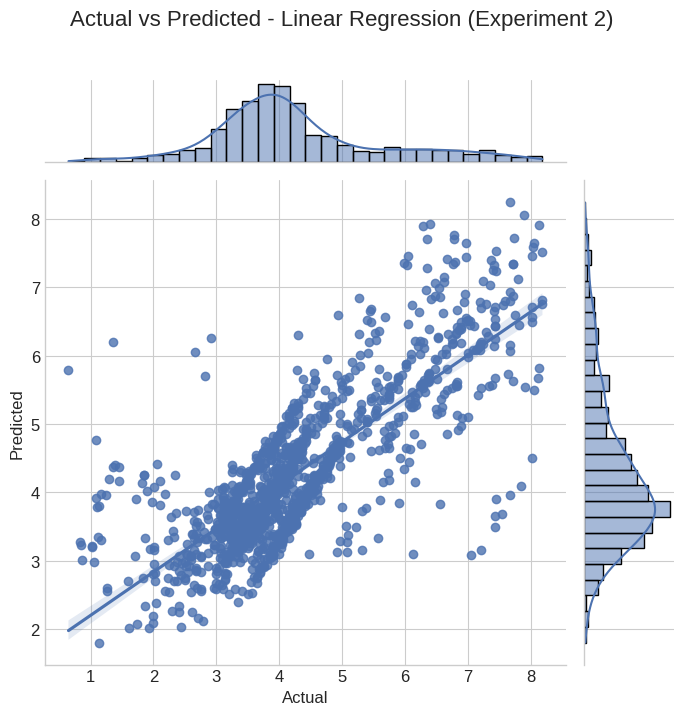

Training Ridge Regression...


<Figure size 1000x800 with 0 Axes>

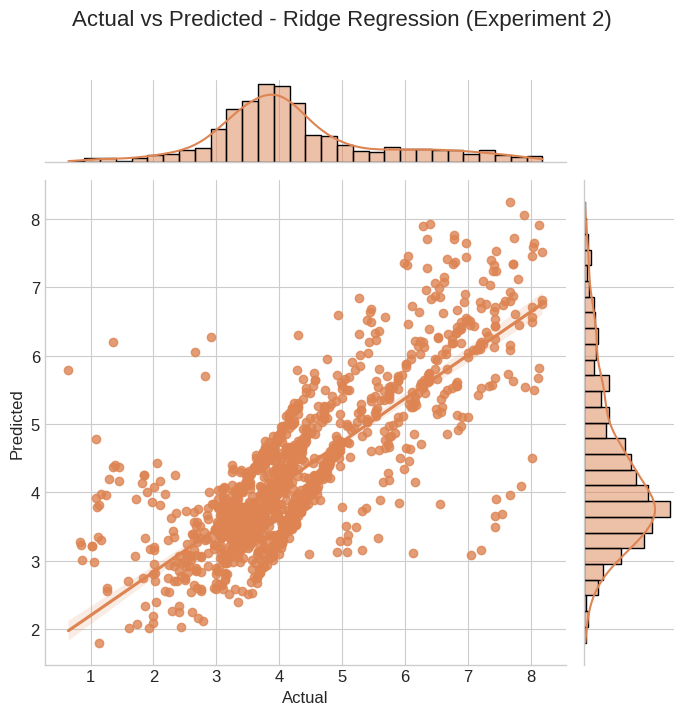

Training Lasso Regression...


<Figure size 1000x800 with 0 Axes>

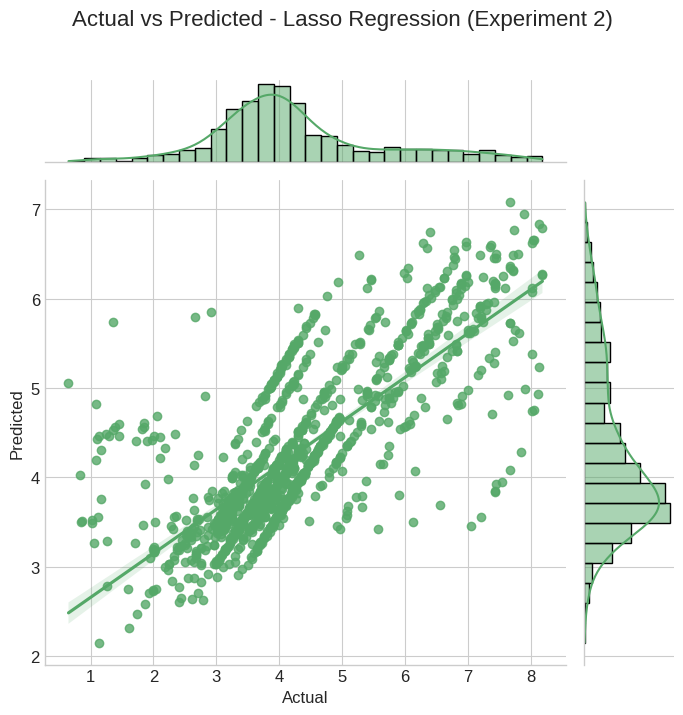

Training Elastic Net...


<Figure size 1000x800 with 0 Axes>

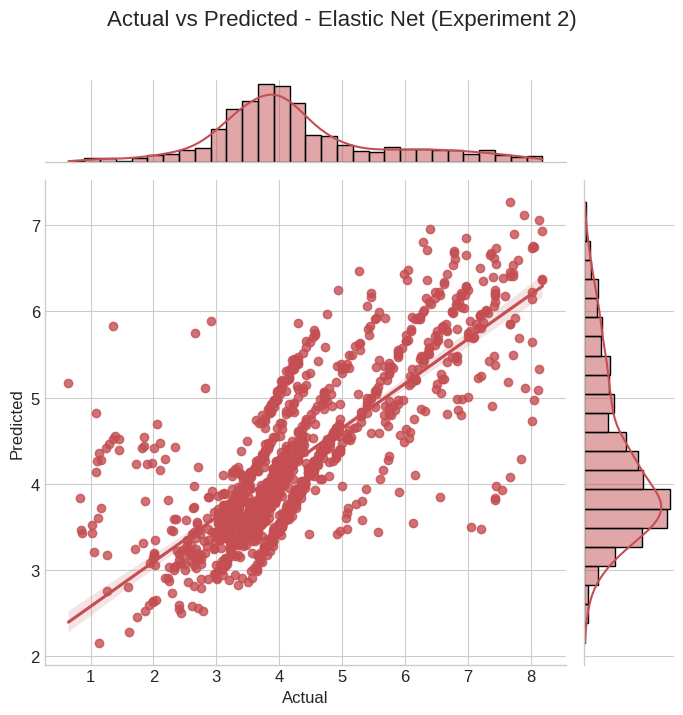

Training Random Forest...


<Figure size 1000x800 with 0 Axes>

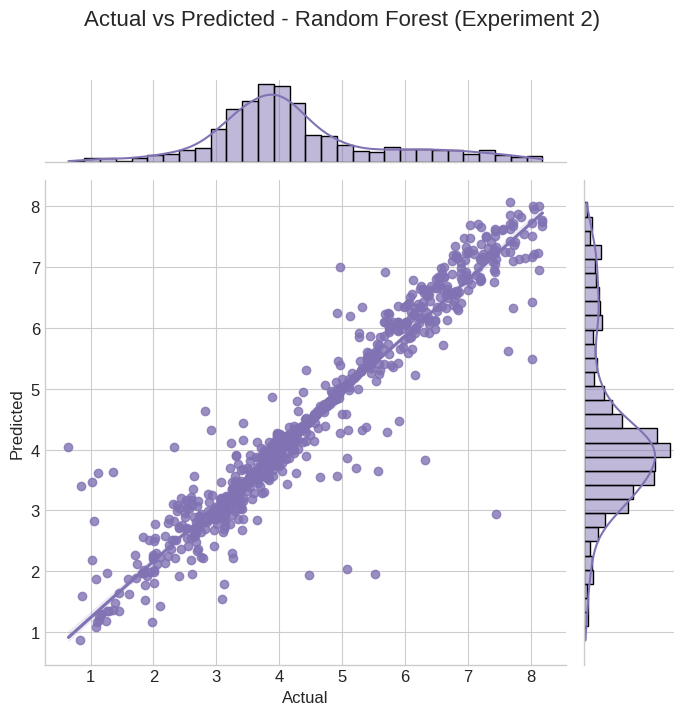

Training Gradient Boosting...


<Figure size 1000x800 with 0 Axes>

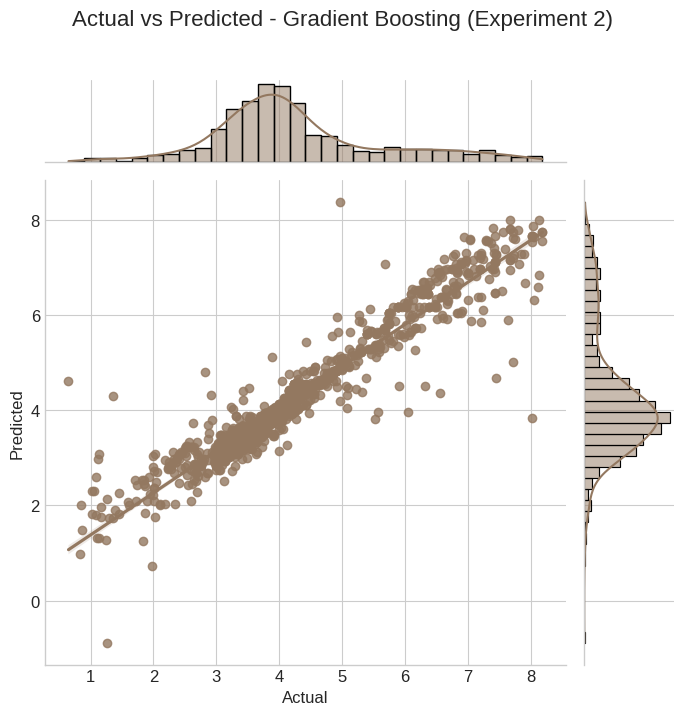

Training XGBoost...


<Figure size 1000x800 with 0 Axes>

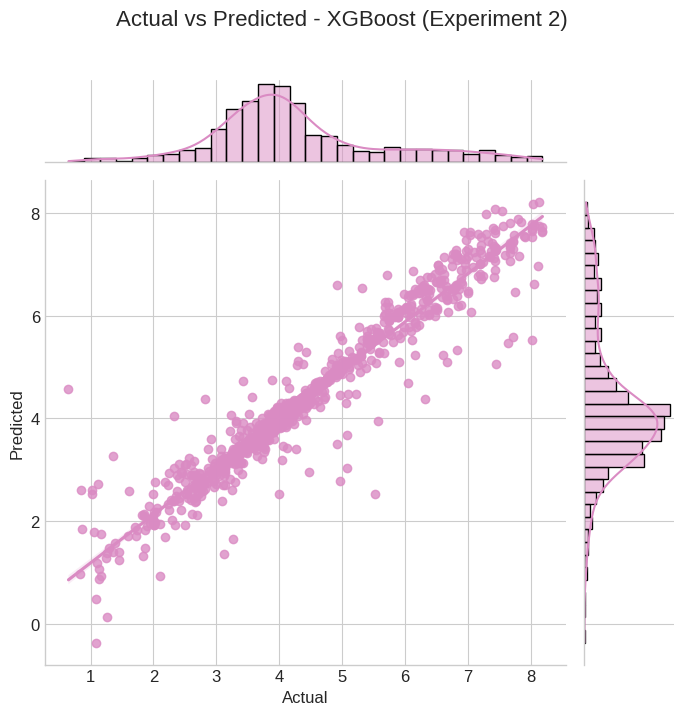

Training SVR...


<Figure size 1000x800 with 0 Axes>

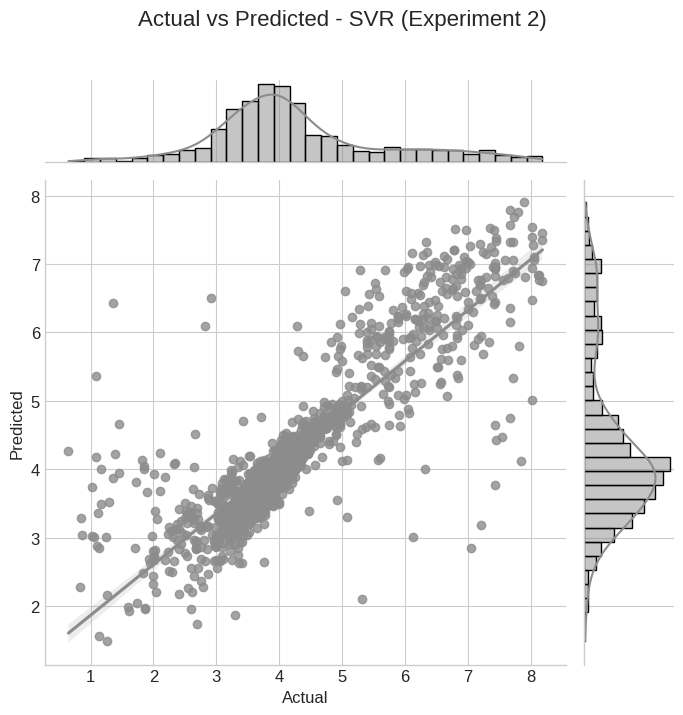

Training K-Neighbors...


<Figure size 1000x800 with 0 Axes>

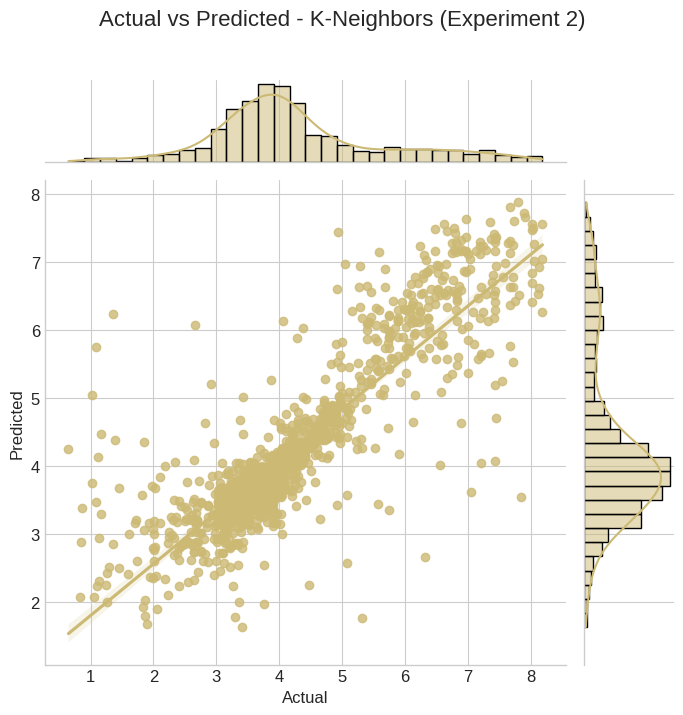

Training AdaBoost...


<Figure size 1000x800 with 0 Axes>

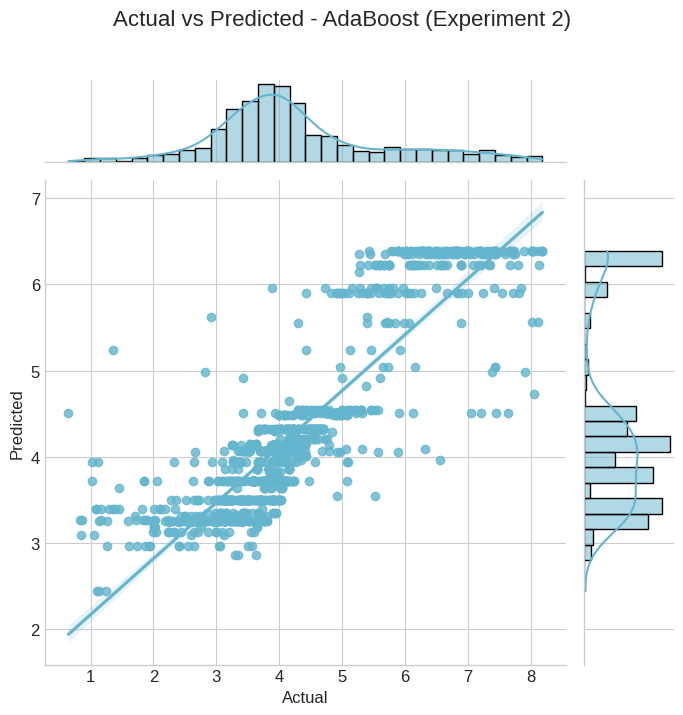


==== Model Comparison for Experiment 2 ====
               Model       MAE       MSE      RMSE  R2_Score  CV_R2_Mean  \
0            XGBoost  0.176921  0.138350  0.371955  0.927857    0.917251   
1      Random Forest  0.170566  0.161600  0.401996  0.915733    0.910542   
2  Gradient Boosting  0.232429  0.176461  0.420072  0.907984    0.896332   
3                SVR  0.384076  0.459065  0.677543  0.760619    0.727003   
4           AdaBoost  0.460800  0.471306  0.686517  0.754235    0.722320   
5        K-Neighbors  0.402797  0.475258  0.689390  0.752174    0.690214   
6   Ridge Regression  0.597575  0.729506  0.854111  0.619596    0.599782   
7  Linear Regression  0.597613  0.729602  0.854168  0.619545    0.599766   
8        Elastic Net  0.608521  0.783599  0.885212  0.591388    0.565240   
9   Lasso Regression  0.617572  0.823414  0.907422  0.570627    0.543113   

   CV_R2_Std  
0   0.007175  
1   0.011285  
2   0.018668  
3   0.023796  
4   0.018084  
5   0.022494  
6   0.025255 

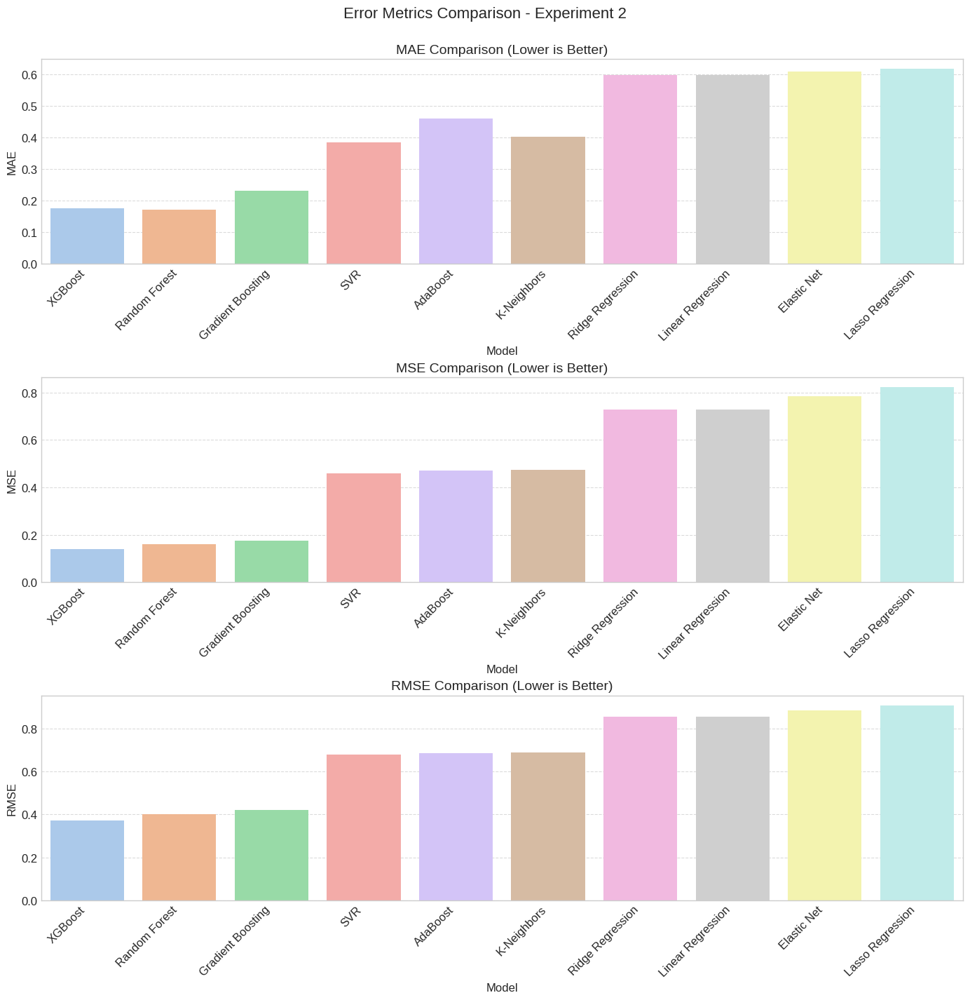

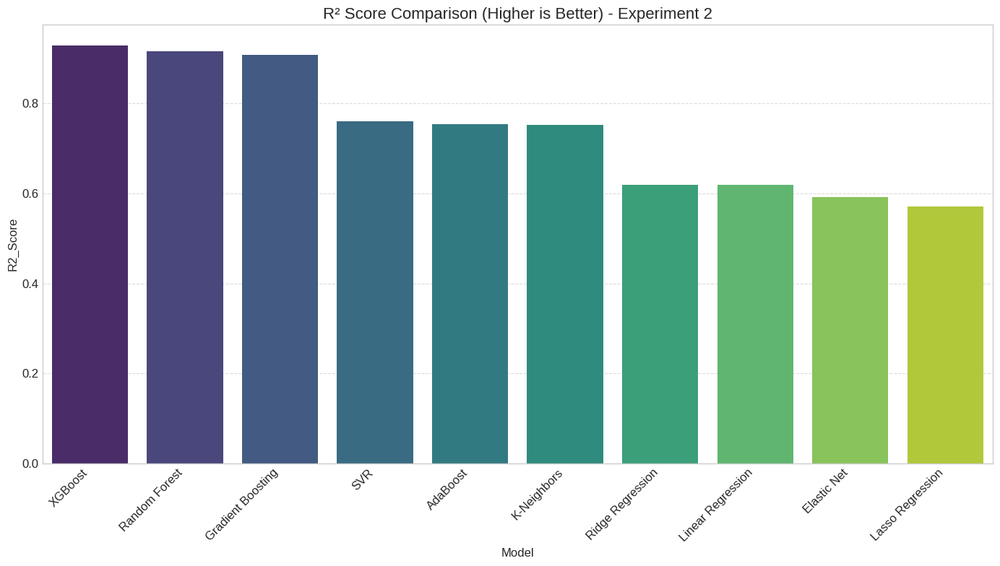

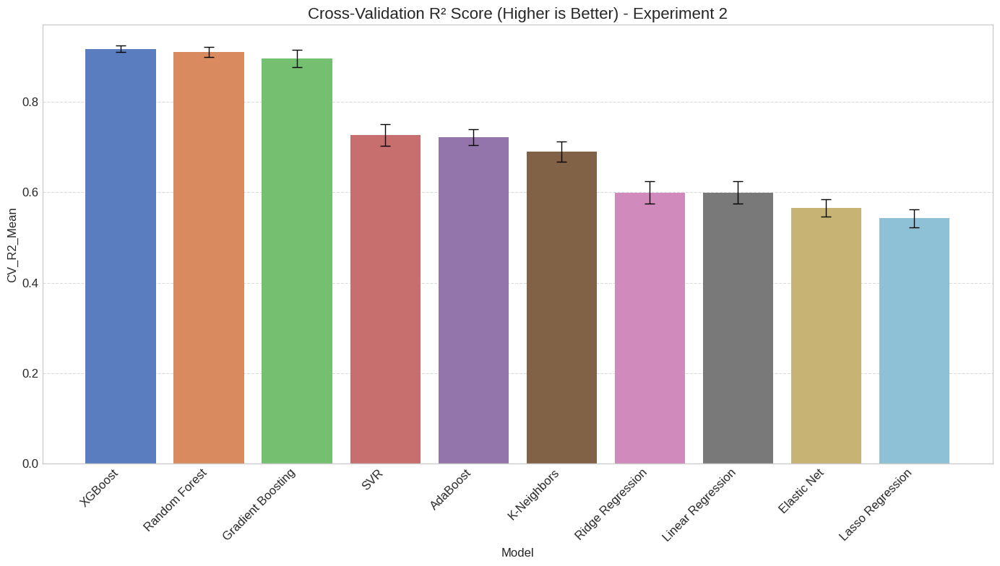


==== Comparing Experiments ====
Best model for Experiment 1: XGBoost with R² Score of 0.9415
Best model for Experiment 2: XGBoost with R² Score of 0.9279
Improvement from Experiment 1 to Experiment 2: -1.45%


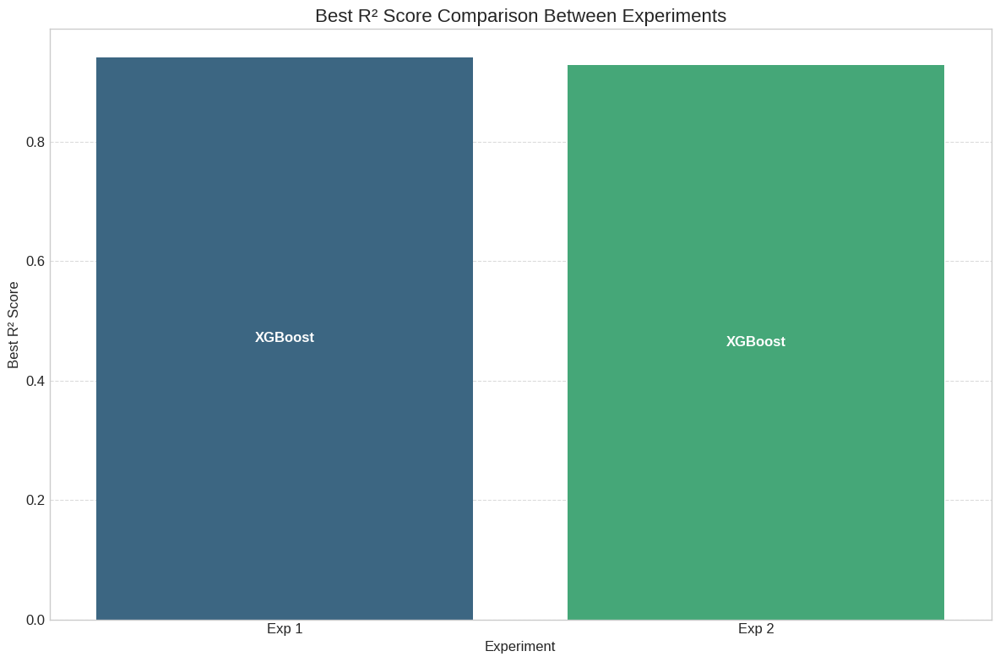


==== Summary of Findings ====
Experiment 1 used the following features:
- factor
- deductions
- element
- jump_comb
- goe
- time_diff
- coarse_class

Experiment 2 added these additional features:
- composition_score
- performance_score
- skating_skills_score
- interpretation_score
- transitions_score

The best performing model in Experiment 1 was XGBoost with an R² score of 0.9415
The best performing model in Experiment 2 was XGBoost with an R² score of 0.9279

Experiment 1 performed better, suggesting that the additional features in Experiment 2 might have introduced noise or overfitting.

Conclusion:
This analysis demonstrates the importance of feature selection in machine learning models. The choice of features can significantly impact model performance.


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from xgboost import XGBRegressor
import warnings
warnings.filterwarnings('ignore')


plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette('deep')


custom_colors = sns.color_palette('deep', 10)
pastel_colors = sns.color_palette('pastel', 10)
dark_colors = sns.color_palette('dark', 10)


plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 12


print("Dataset shape:", merged_df.shape)
print("\nBasic statistics:")
print(merged_df.describe())


def remove_outliers_iqr(df, columns=None, multiplier=1.5):
    
    df_clean = df.copy()

    if columns is None:
        columns = df.select_dtypes(include=['float64', 'int64']).columns

    print(f"Removing outliers from {len(columns)} numeric columns...")
    original_len = len(df_clean)
    total_original = original_len

    
    for column in columns:
        Q1 = df_clean[column].quantile(0.25)
        Q3 = df_clean[column].quantile(0.75)
        IQR = Q3 - Q1

        lower_bound = Q1 - multiplier * IQR
        upper_bound = Q3 + multiplier * IQR

        
        mask = (df_clean[column] >= lower_bound) & (df_clean[column] <= upper_bound)
        df_clean = df_clean[mask]

        outliers_removed = original_len - len(df_clean)
        if outliers_removed > 0:
            print(f"  - Removed {outliers_removed} outliers from '{column}' column")
            original_len = len(df_clean)

    total_removed = total_original - len(df_clean)
    print(f"Total rows removed: {total_removed} ({total_removed/total_original*100:.2f}% of original data)")

    return df_clean


print("\n==== Cleaning Data - Removing Outliers ====")
cleaned_df = remove_outliers_iqr(merged_df)
print(f"Original data shape: {merged_df.shape}, Cleaned data shape: {cleaned_df.shape}")


def visualize_data(df, target='score_of_panel', save_plots=False):
    
    print("\n==== Data Visualization (After Outlier Removal) ====")

    
    numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns
    n_cols = len(numeric_cols)
    n_rows = (n_cols + 2) // 3  

    plt.figure(figsize=(18, n_rows * 5))
    for i, col in enumerate(numeric_cols):
        plt.subplot(n_rows, 3, i + 1)
        sns.histplot(df[col], kde=True, color=custom_colors[i % len(custom_colors)])
        plt.title(f'Distribution of {col}')
        plt.tight_layout()

    if save_plots:
        plt.savefig('histograms.png', dpi=300, bbox_inches='tight')
    plt.show()

    
    plt.figure(figsize=(18, 10))
    for i, col in enumerate(numeric_cols):
        plt.subplot(2, (n_cols + 1) // 2, i + 1)
        sns.boxplot(y=df[col], color=pastel_colors[i % len(pastel_colors)])
        plt.title(f'Box Plot of {col}')
        plt.tight_layout()

    if save_plots:
        plt.savefig('boxplots.png', dpi=300, bbox_inches='tight')
    plt.show()

    
    for i, col in enumerate(numeric_cols):
        if col != target:
            plt.figure(figsize=(10, 6))
            sns.scatterplot(x=col, y=target, data=df, alpha=0.6,
                          color=dark_colors[i % len(dark_colors)])
            plt.title(f'{target} vs {col}')
            plt.xlabel(col)
            plt.ylabel(target)
            plt.tight_layout()

            if save_plots:
                plt.savefig(f'scatter_{col}_vs_{target}.png', dpi=300, bbox_inches='tight')
            plt.show()

    
    plt.figure(figsize=(14, 10))
    corr_matrix = df.select_dtypes(include=['float64', 'int64']).corr()
    mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
    cmap = sns.diverging_palette(230, 20, as_cmap=True)

    sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap=cmap, mask=mask,
               square=True, linewidths=0.5, cbar_kws={"shrink": 0.8})
    plt.title('Correlation Heatmap', fontsize=16)

    if save_plots:
        plt.savefig('correlation_heatmap.png', dpi=300, bbox_inches='tight')
    plt.show()

    
    important_features = [col for col in numeric_cols if col != target][:5]  # Take top 5
    for i, col in enumerate(important_features):
        plt.figure(figsize=(10, 8))
        sns.jointplot(x=col, y=target, data=df, kind='reg',
                     color=custom_colors[i % len(custom_colors)])
        plt.suptitle(f'Joint Plot of {target} vs {col}', y=1.02, fontsize=16)
        plt.tight_layout()

        if save_plots:
            plt.savefig(f'jointplot_{col}.png', dpi=300, bbox_inches='tight')
        plt.show()

    
    subset_cols = [target] + important_features[:4]  
    plt.figure(figsize=(16, 12))
    pair_plot = sns.pairplot(df[subset_cols], diag_kind='kde',
                           plot_kws={'alpha': 0.6, 's': 30, 'edgecolor': 'k'},
                           height=2.5)
    pair_plot.fig.suptitle('Pair Plot of Key Features', y=1.02, fontsize=16)

    if save_plots:
        plt.savefig('pairplot.png', dpi=300, bbox_inches='tight')
    plt.show()

    
    cat_cols = df.select_dtypes(include=['object']).columns
    for i, col in enumerate(cat_cols):
        plt.figure(figsize=(14, 8))
        value_counts = df[col].value_counts()

        
        if len(value_counts) > 20:
            top_cats = value_counts.head(20).index
            df_temp = df.copy()
            df_temp.loc[~df_temp[col].isin(top_cats), col] = 'Other'
            sns.countplot(y=col, data=df_temp, order=df_temp[col].value_counts().index,
                        palette='viridis')
            plt.title(f'Count Plot of {col} (Top 20 Categories)')
        else:
            sns.countplot(y=col, data=df, order=df[col].value_counts().index,
                        palette='viridis')
            plt.title(f'Count Plot of {col}')

        plt.xlabel('Count')
        plt.ylabel(col)
        plt.tight_layout()

        if save_plots:
            plt.savefig(f'countplot_{col}.png', dpi=300, bbox_inches='tight')
        plt.show()


def preprocess_data(df, exp_num, target='score_of_panel'):
    
    print(f"\n==== Data Preprocessing for Experiment {exp_num} ====")

    
    if exp_num == 1:
        features = ['factor', 'deductions', 'element', 'jump_comb',
                    'goe', 'time_diff', 'coarse_class']
    else:  # Experiment 2
        features = ['factor', 'deductions', 'element', 'jump_comb',
                    'goe', 'time_diff', 'coarse_class',
                   'skating_skills_score', 'transitions_score', 'performance_score',
                   'composition_score', 'interpretation_score']

    
    df_copy = df.copy()

    
    for col in features:
        if df_copy[col].dtype == 'object':
            df_copy[col].fillna('Unknown', inplace=True)

    
    X = df_copy[features].copy()
    y = df_copy[target].copy()

    print(f"Features: {features}")
    print(f"X shape: {X.shape}, y shape: {y.shape}")

    
    label_encoders = {}
    for col in X.select_dtypes(include=['object']).columns:
        le = LabelEncoder()
        X[col] = le.fit_transform(X[col])
        label_encoders[col] = le
        print(f"Encoded {col} with {len(le.classes_)} unique values")

    
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42
    )

    print(f"Train set: {X_train.shape}, Test set: {X_test.shape}")

    
    scaler = StandardScaler()
    numeric_cols = X_train.select_dtypes(include=['float64', 'int64']).columns
    X_train[numeric_cols] = scaler.fit_transform(X_train[numeric_cols])
    X_test[numeric_cols] = scaler.transform(X_test[numeric_cols])

    return X_train, X_test, y_train, y_test, features

    
    X = df_copy[features].copy()
    y = df_copy[target].copy()

    print(f"Features: {features}")
    print(f"X shape: {X.shape}, y shape: {y.shape}")

    
    label_encoders = {}
    for col in X.select_dtypes(include=['object']).columns:
        le = LabelEncoder()
        X[col] = le.fit_transform(X[col])
        label_encoders[col] = le
        print(f"Encoded {col} with {len(le.classes_)} unique values")

    
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42
    )

    print(f"Train set: {X_train.shape}, Test set: {X_test.shape}")

    
    scaler = StandardScaler()
    numeric_cols = X_train.select_dtypes(include=['float64', 'int64']).columns
    X_train[numeric_cols] = scaler.fit_transform(X_train[numeric_cols])
    X_test[numeric_cols] = scaler.transform(X_test[numeric_cols])

    return X_train, X_test, y_train, y_test, features


def train_and_evaluate_models(X_train, X_test, y_train, y_test, exp_num):
    
    print(f"\n==== Model Training and Evaluation for Experiment {exp_num} ====")

    
    models = {
        'Linear Regression': LinearRegression(),
        'Ridge Regression': Ridge(alpha=1.0),
        'Lasso Regression': Lasso(alpha=0.1),
        'Elastic Net': ElasticNet(alpha=0.1, l1_ratio=0.5),
        'Random Forest': RandomForestRegressor(n_estimators=100, random_state=42),
        'Gradient Boosting': GradientBoostingRegressor(n_estimators=100, random_state=42),
        'XGBoost': XGBRegressor(n_estimators=100, random_state=42),
        'SVR': SVR(kernel='rbf', C=1.0),
        'K-Neighbors': KNeighborsRegressor(n_neighbors=5),
        'AdaBoost': AdaBoostRegressor(n_estimators=100, random_state=42)
    }

    
    results = pd.DataFrame(columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2_Score', 'CV_R2_Mean', 'CV_R2_Std'])

    
    for name, model in models.items():
        print(f"Training {name}...")

        
        model.fit(X_train, y_train)

        
        y_pred = model.predict(X_test)

        
        mae = mean_absolute_error(y_test, y_pred)
        mse = mean_squared_error(y_test, y_pred)
        rmse = np.sqrt(mse)
        r2 = r2_score(y_test, y_pred)

        
        kf = KFold(n_splits=5, shuffle=True, random_state=42)
        cv_scores = cross_val_score(model, X_train, y_train, cv=kf, scoring='r2')

        
        new_row = pd.DataFrame({
            'Model': [name],
            'MAE': [mae],
            'MSE': [mse],
            'RMSE': [rmse],
            'R2_Score': [r2],
            'CV_R2_Mean': [cv_scores.mean()],
            'CV_R2_Std': [cv_scores.std()]
        })
        results = pd.concat([results, new_row], ignore_index=True)

        
        plt.figure(figsize=(10, 8))
        joint_data = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
        sns.jointplot(x='Actual', y='Predicted', data=joint_data, kind='reg',
                    height=7, color=custom_colors[list(models.keys()).index(name) % len(custom_colors)])
        plt.suptitle(f'Actual vs Predicted - {name} (Experiment {exp_num})', y=1.02, fontsize=16)
        plt.tight_layout()
        plt.show()

    return results


def visualize_model_comparison(results, exp_num):
    
    print(f"\n==== Model Comparison for Experiment {exp_num} ====")

    
    results_sorted = results.sort_values(by='R2_Score', ascending=False).reset_index(drop=True)
    print(results_sorted)

    
    metrics = ['MAE', 'MSE', 'RMSE']

    fig, axes = plt.subplots(len(metrics), 1, figsize=(14, 15))

    for i, metric in enumerate(metrics):
        sns.barplot(x='Model', y=metric, data=results_sorted, ax=axes[i],
                   palette=pastel_colors)
        axes[i].set_title(f'{metric} Comparison (Lower is Better)', fontsize=14)
        axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=45, ha='right')
        axes[i].grid(axis='y', linestyle='--', alpha=0.7)

    plt.suptitle(f'Error Metrics Comparison - Experiment {exp_num}', fontsize=16, y=0.95)
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    plt.show()

    
    plt.figure(figsize=(14, 8))
    sns.barplot(x='Model', y='R2_Score', data=results_sorted, palette='viridis')
    plt.title(f'R² Score Comparison (Higher is Better) - Experiment {exp_num}', fontsize=16)
    plt.xticks(rotation=45, ha='right')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

    
    plt.figure(figsize=(14, 8))
    sns.barplot(x='Model', y='CV_R2_Mean', data=results_sorted, palette='muted')

    
    x_pos = np.arange(len(results_sorted))
    plt.errorbar(x_pos, results_sorted['CV_R2_Mean'], yerr=results_sorted['CV_R2_Std'],
               fmt='none', capsize=5, ecolor='black', linewidth=1)

    plt.title(f'Cross-Validation R² Score (Higher is Better) - Experiment {exp_num}', fontsize=16)
    plt.xticks(rotation=45, ha='right')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

# Experiment 1
visualize_data(cleaned_df)
X_train_1, X_test_1, y_train_1, y_test_1, features_1 = preprocess_data(cleaned_df, exp_num=1)
results_1 = train_and_evaluate_models(X_train_1, X_test_1, y_train_1, y_test_1, exp_num=1)
visualize_model_comparison(results_1, exp_num=1)

# Experiment 2
X_train_2, X_test_2, y_train_2, y_test_2, features_2 = preprocess_data(cleaned_df, exp_num=2)
results_2 = train_and_evaluate_models(X_train_2, X_test_2, y_train_2, y_test_2, exp_num=2)
visualize_model_comparison(results_2, exp_num=2)


print("\n==== Comparing Experiments ====")
best_model_1 = results_1.loc[results_1['R2_Score'].idxmax()]
best_model_2 = results_2.loc[results_2['R2_Score'].idxmax()]

print(f"Best model for Experiment 1: {best_model_1['Model']} with R² Score of {best_model_1['R2_Score']:.4f}")
print(f"Best model for Experiment 2: {best_model_2['Model']} with R² Score of {best_model_2['R2_Score']:.4f}")

improvement = (best_model_2['R2_Score'] - best_model_1['R2_Score']) / best_model_1['R2_Score'] * 100
print(f"Improvement from Experiment 1 to Experiment 2: {improvement:.2f}%")


plt.figure(figsize=(12, 8))
exp_data = pd.DataFrame({
    'Experiment': ['Exp 1', 'Exp 2'],
    'Best R² Score': [best_model_1['R2_Score'], best_model_2['R2_Score']],
    'Best Model': [best_model_1['Model'], best_model_2['Model']]
})

sns.barplot(x='Experiment', y='Best R² Score', data=exp_data, palette='viridis')
plt.title('Best R² Score Comparison Between Experiments', fontsize=16)
plt.grid(axis='y', linestyle='--', alpha=0.7)


for i, model in enumerate(exp_data['Best Model']):
    plt.text(i, exp_data['Best R² Score'][i]/2, model,
             ha='center', va='center', fontsize=12, color='white', fontweight='bold')

plt.tight_layout()
plt.show()


print("\n==== Summary of Findings ====")
print("Experiment 1 used the following features:")
for feature in features_1:
    print(f"- {feature}")

print("\nExperiment 2 added these additional features:")
additional_features = set(features_2) - set(features_1)
for feature in additional_features:
    print(f"- {feature}")

print(f"\nThe best performing model in Experiment 1 was {best_model_1['Model']} with an R² score of {best_model_1['R2_Score']:.4f}")
print(f"The best performing model in Experiment 2 was {best_model_2['Model']} with an R² score of {best_model_2['R2_Score']:.4f}")

if best_model_2['R2_Score'] > best_model_1['R2_Score']:
    print(f"\nExperiment 2 showed improved performance by {improvement:.2f}%, indicating that the additional features contributed positively to the prediction of the target variable.")
else:
    print("\nExperiment 1 performed better, suggesting that the additional features in Experiment 2 might have introduced noise or overfitting.")

print("\nConclusion:")
print("This analysis demonstrates the importance of feature selection in machine learning models. The choice of features can significantly impact model performance.")

# Feature Importance


==== Feature Importance Analysis for Experiment 1 ====

Feature ranking:
1. element (0.4243)
2. goe (0.2730)
3. jump_comb (0.1419)
4. coarse_class (0.1273)
5. time_diff (0.0136)
6. factor (0.0132)
7. deductions (0.0066)


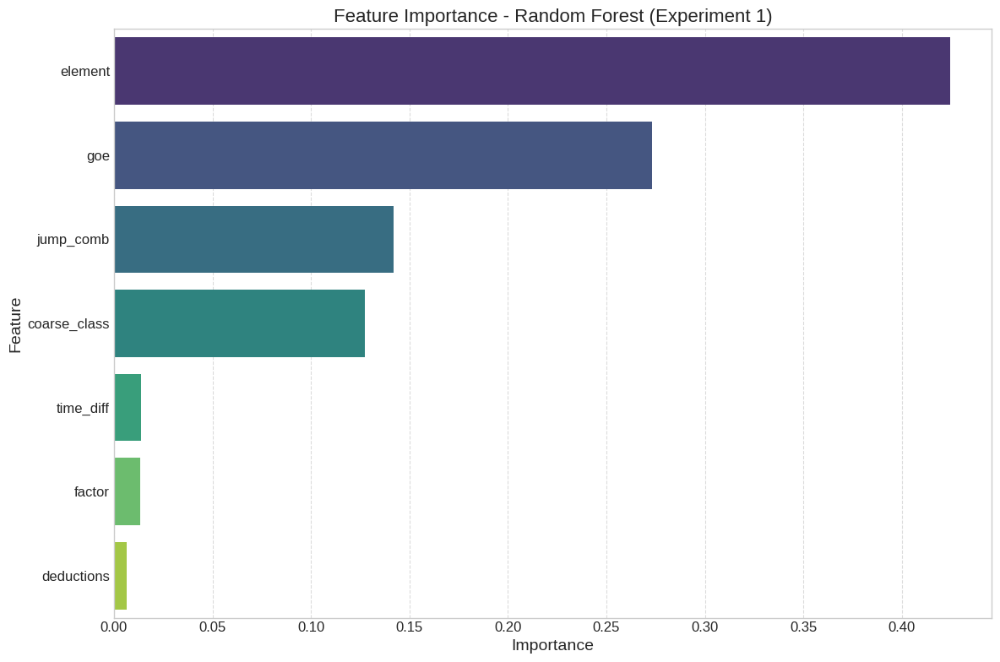


==== Feature Importance Analysis for Experiment 2 ====

Feature ranking:
1. element (0.4055)
2. goe (0.2537)
3. jump_comb (0.1421)
4. coarse_class (0.1284)
5. performance_score (0.0160)
6. skating_skills_score (0.0112)
7. time_diff (0.0106)
8. factor (0.0090)
9. transitions_score (0.0073)
10. interpretation_score (0.0069)
11. composition_score (0.0065)
12. deductions (0.0027)


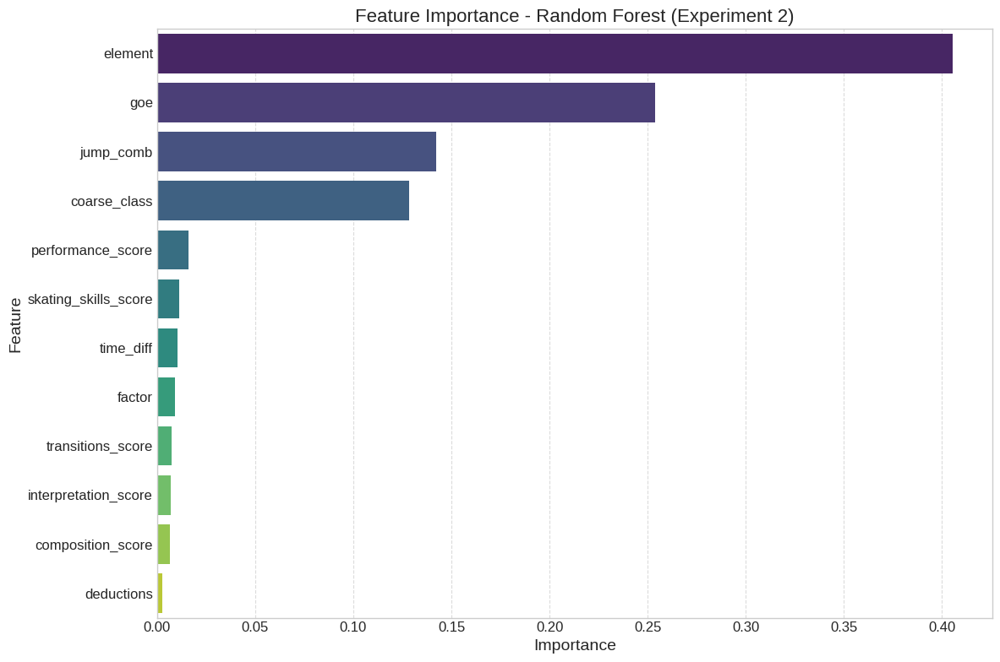


==== Comparing Feature Importance Between Experiments ====
The following additional features in Experiment 2 are among the top 5 most important:
- performance_score (Rank: 5, Importance: 0.0160)


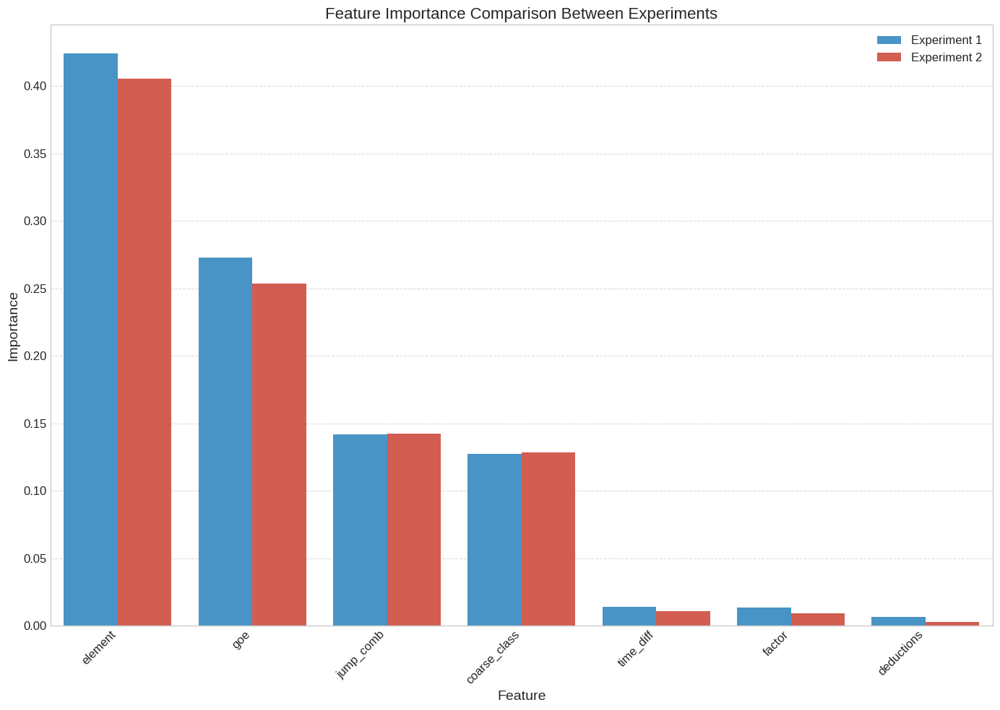

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor


def plot_feature_importance(X_train, X_test, y_train, y_test, features, exp_num):
    
    print(f"\n==== Feature Importance Analysis for Experiment {exp_num} ====")

    
    rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
    rf_model.fit(X_train, y_train)

    
    importances = rf_model.feature_importances_
    indices = np.argsort(importances)[::-1]

    
    feature_importance_df = pd.DataFrame({
        'Feature': [features[i] for i in indices],
        'Importance': importances[indices]
    })

    
    print("\nFeature ranking:")
    for i, idx in enumerate(indices):
        print(f"{i+1}. {features[idx]} ({importances[idx]:.4f})")

    
    plt.figure(figsize=(12, 8))
    sns.barplot(x='Importance', y='Feature', data=feature_importance_df, palette='viridis')
    plt.title(f'Feature Importance - Random Forest (Experiment {exp_num})', fontsize=16)
    plt.xlabel('Importance', fontsize=14)
    plt.ylabel('Feature', fontsize=14)
    plt.grid(axis='x', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

    return rf_model, feature_importance_df


rf_model_1, feature_imp_1 = plot_feature_importance(X_train_1, X_test_1, y_train_1, y_test_1, features_1, exp_num=1)


rf_model_2, feature_imp_2 = plot_feature_importance(X_train_2, X_test_2, y_train_2, y_test_2, features_2, exp_num=2)


if len(features_2) > len(features_1):
    print("\n==== Comparing Feature Importance Between Experiments ====")
   
    additional_features = set(features_2) - set(features_1)

    
    top_n = 5  
    top_features_exp2 = feature_imp_2['Feature'].values[:top_n]

    important_additional = [feat for feat in additional_features if feat in top_features_exp2]

    if important_additional:
        print(f"The following additional features in Experiment 2 are among the top {top_n} most important:")
        for feat in important_additional:
            idx = list(top_features_exp2).index(feat)
            print(f"- {feat} (Rank: {idx+1}, Importance: {feature_imp_2['Importance'].values[idx]:.4f})")
    else:
        print(f"None of the additional features in Experiment 2 are among the top {top_n} most important.")

    
    common_features = set(features_1).intersection(set(features_2))

    
    common_imp_1 = {feat: imp for feat, imp in zip(features_1, rf_model_1.feature_importances_)}
    common_imp_2 = {feat: imp for feat, imp in zip(features_2, rf_model_2.feature_importances_)}

    
    compare_df = pd.DataFrame({
        'Feature': list(common_features),
        'Importance_Exp1': [common_imp_1.get(feat, 0) for feat in common_features],
        'Importance_Exp2': [common_imp_2.get(feat, 0) for feat in common_features]
    })

    
    compare_df['Avg_Importance'] = (compare_df['Importance_Exp1'] + compare_df['Importance_Exp2']) / 2
    compare_df = compare_df.sort_values('Avg_Importance', ascending=False).drop('Avg_Importance', axis=1)

    
    compare_df_melted = pd.melt(compare_df, id_vars=['Feature'],
                              value_vars=['Importance_Exp1', 'Importance_Exp2'],
                              var_name='Experiment', value_name='Importance')
    compare_df_melted['Experiment'] = compare_df_melted['Experiment'].map({
        'Importance_Exp1': 'Experiment 1',
        'Importance_Exp2': 'Experiment 2'
    })

    
    plt.figure(figsize=(14, 10))
    sns.barplot(x='Feature', y='Importance', hue='Experiment', data=compare_df_melted,
               palette=['#3498db', '#e74c3c'])
    plt.title('Feature Importance Comparison Between Experiments', fontsize=16)
    plt.xlabel('Feature', fontsize=14)
    plt.ylabel('Importance', fontsize=14)
    plt.xticks(rotation=45, ha='right')
    plt.legend(title='', loc='upper right')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()